# Native Multi-Output Baseline Methods for Mass Spectrometry Prediction

This notebook evaluates strong non-neural baselines that have native multi-output support for EI mass spectrum prediction. Given features $\mathbf{x}\in\mathbb{R}^d$ and a sqrt-transformed target spectrum $\mathbf{y}\in\mathbb{R}_{\ge 0}^B$, models predict $\hat{\mathbf{y}}\ge 0$ across all $B$ m/z bins jointly.

## Problem setup and notation
- **Inputs**: $\mathbf{x}\in\mathbb{R}^d$ (HPJ features)
- **Targets**: raw intensities $\tilde{\mathbf{y}}\in\mathbb{R}_{\ge 0}^B$
- **Transform**: $\mathbf{y}=\sqrt{\tilde{\mathbf{y}}}$ used for training/evaluation; predictions are clipped to $\hat{\mathbf{y}}\ge 0$.

## Method families (native multi-output)
- **Statistical**: Zero, Mean, Median, Random, Frequency-weighted
- **Linear**: OLS, Ridge, Bayesian Ridge
- **Neighbors**: KNN (various k, distance/uniform), Radius Neighbors
- **Trees**: Decision Tree, Random Forest, Extra Trees

## Evaluation overview
- Primary metric: cosine similarity on the $\sqrt{\cdot}$ scale
- Secondary: MSE, MAE, $R^2$, peak precision/recall/F1, regional m/z analysis
- Ensembles (RF/ET): model uncertainty from per-tree variance

```mermaid
flowchart LR
  A["Featurized x ∈ R^d"] --> S["Optional StandardScaler"]
  S --> M{"Native multi-output model"}
  M --> Yhat["ŷ ∈ R_+^B (clip ≥ 0)"]
  Yhat --> L["Metrics: cosine, MSE, MAE, F1"]
  Yhat --> R["Regional m/z analysis"]
```

## 1. Environment Setup

This section:
- Imports scikit-learn baselines with native multi-output support
- Loads scientific Python stack and plotting libraries
- Sets deterministic seeds for reproducibility
- Configures plotting defaults

Mermaid/MathJax are used in markdown only; no code changes are required.

In [7]:
# Standard library imports
import os
import json
import pickle
import time
import warnings
import io
import random
from typing import Dict, Any, Tuple, List, Optional
import gc

# Data science imports
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from matplotlib.patches import Patch
from matplotlib.lines import Line2D
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
import seaborn as sns
from tqdm import tqdm
from scipy.spatial.distance import cosine

# Machine learning imports - only native multi-output
from sklearn.linear_model import LinearRegression, Ridge, BayesianRidge
from sklearn.neighbors import KNeighborsRegressor, RadiusNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, ExtraTreesRegressor
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error

# Chemistry imports (optional)
try:
    from rdkit import Chem
    from rdkit.Chem import Descriptors
    from rdkit.Chem.Draw import rdMolDraw2D
    RDKIT_AVAILABLE = True
    print("RDKit available for molecular structure visualization")
except ImportError:
    RDKIT_AVAILABLE = False
    print("Warning: RDKit not available. Molecular structure features will be limited.")

# Configure warnings and display
warnings.filterwarnings('ignore')
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)
pd.set_option('display.max_colwidth', None)

# Set random seeds
SEED = 42
np.random.seed(SEED)
random.seed(SEED)

# Configure matplotlib
plt.rcParams['figure.dpi'] = 100
plt.rcParams['savefig.dpi'] = 300
plt.rcParams['font.size'] = 10

print("Environment setup complete")

RDKit available for molecular structure visualization
Environment setup complete


## 2. Master Configuration

Centralized configuration mirrors the neural notebook for comparability:
- `paths`: results/models directories; HPJ input type; optional selected/full data
- `data`: `transform_sqrt=True` applies $y=\sqrt{\tilde y}$
- `linear`: ridge $\alpha$, Bayesian max iters
- `neighbors`: $k$ list, weighting, radius, native `n_jobs`
- `tree`: depth/estimators and parallelism for RF/ET
- `evaluation`: `mz_step`, `peak_threshold`

All outputs and summaries are written to `models/native_baselines`.

In [8]:
BASELINE_CONFIG = {
    # Paths configuration (same as main notebook)
    'paths': {
        'results_dir': '../data/results',
        'models_dir': '../models/native_baselines',
        'input_type': 'hpj',
        'use_selected_data': False,
        'data_subdir': lambda use_sel: 'selected' if use_sel else 'full_featurised'
    },
    
    # Data settings (same as main notebook)
    'data': {
        'random_state': 42,
        'transform_sqrt': True,
    },
    
    # Linear methods parameters (native multi-output)
    'linear': {
        'ridge_alpha': 1.0,
        'bayesian_max_iter': 300
    },
    
    # Nearest neighbor parameters (native multi-output)
    'neighbors': {
        'knn_neighbors': [5, 10, 20],  # Multiple k values
        'knn_weights': 'distance',
        'radius': 500.0,
        'n_jobs': -1  # Native parallelization
    },
    
    # Tree-based parameters (native multi-output)
    'tree': {
        'decision_tree_max_depth': 20,
        'decision_tree_min_samples_split': 5,
        'rf_n_estimators': 50,  # Reduced for speed
        'rf_max_depth': 15,
        'rf_n_jobs': -1,
        'extra_trees_n_estimators': 50,
        'extra_trees_max_depth': 15,
        'extra_trees_n_jobs': -1
    },
    
    # Evaluation settings (same as main notebook)
    'evaluation': {
        'mz_step': 50,
        'max_mz': 1000,
        'peak_threshold': 0.01
    }
}

# Create baseline models directory
os.makedirs(BASELINE_CONFIG['paths']['models_dir'], exist_ok=True)

# Model registry
MODEL_REGISTRY = {
    'statistical': [],
    'linear': [],
    'neighbors': [],
    'tree': []
}

print("Configuration loaded")
print(f"Models will be saved to: {BASELINE_CONFIG['paths']['models_dir']}")

Configuration loaded
Models will be saved to: ../models/native_baselines


## 3. Data Loading and Utility Functions

All methods consume the same JSONL inputs as the neural notebook and share the standard evaluation suite.

- Data loading from JSONL files into $(X,y)$
- Cosine similarity and Weighted Dot Product (WDP)
- Peak detection after per-spectrum max-normalization at threshold $\tau$
- Regional m/z analysis with statistical and (for ensembles) model uncertainty

```mermaid
flowchart LR
  F["train/val/test JSONL"] --> Parse["Parse → arrays"]
  Parse --> Split["(X, y) splits"]
  Split --> Eval["Metrics + plots"]
```

In [9]:
def get_data_paths(config):
    """Get data file paths based on configuration."""
    input_type_dir = os.path.join(config['paths']['results_dir'], config['paths']['input_type'])
    data_dir = os.path.join(input_type_dir, config['paths']['data_subdir'](config['paths']['use_selected_data']))
    
    return {
        'train': os.path.join(data_dir, 'train_data.jsonl'),
        'val': os.path.join(data_dir, 'val_data.jsonl'),
        'test': os.path.join(data_dir, 'test_data.jsonl')
    }

def load_jsonl_data(filepath):
    """Load data from JSONL file."""
    smiles_list, features, targets = [], [], []
    
    if not os.path.exists(filepath):
        print(f"File not found: {filepath}")
        return smiles_list, np.array(features), np.array(targets)
    
    # Count lines
    with open(filepath, 'r') as f:
        total_lines = sum(1 for _ in f)
    
    with open(filepath, 'r') as f:
        for line in tqdm(f, desc=f"Loading {os.path.basename(filepath)}", 
                       total=total_lines, unit="spectra"):
            try:
                record = json.loads(line)
                smiles = record.get("smiles")
                feat = record.get("features")
                targ = record.get("target")
                
                if smiles and feat is not None and targ is not None:
                    smiles_list.append(smiles)
                    features.append(feat)
                    targets.append(targ)
            except (json.JSONDecodeError, KeyError) as e:
                continue
    
    print(f"Loaded {len(smiles_list)} samples from {os.path.basename(filepath)}")
    return smiles_list, np.array(features), np.array(targets)

def load_all_data(config):
    """Load all datasets."""
    print("Loading datasets...")
    
    paths = get_data_paths(config)
    datasets = {}
    
    for name, path in paths.items():
        datasets[name] = load_jsonl_data(path)
    
    # Print dataset statistics
    for name, (smiles, X, y) in datasets.items():
        if len(X) > 0:
            print(f"{name.capitalize()} data: {len(X)} samples, "
                  f"X shape: {X.shape}, y shape: {y.shape}")
    
    return datasets

def cosine_similarity_matrix(y_true, y_pred):
    """Calculate cosine similarity between true and predicted spectra."""
    similarities = []
    for i in range(len(y_true)):
        true_spec = y_true[i]
        pred_spec = y_pred[i]
        
        if np.sum(true_spec) == 0 or np.sum(pred_spec) == 0:
            cos_sim = 0 if np.sum(true_spec) != np.sum(pred_spec) else 1
        else:
            cos_sim = 1 - cosine(true_spec, pred_spec)
        
        similarities.append(cos_sim if not np.isnan(cos_sim) else 0)
    
    return np.mean(similarities), np.array(similarities)

def weighted_dot_product(y_true: np.ndarray, y_pred: np.ndarray, eps: float = 1e-8) -> float:
    """Calculate weighted dot product (WDP) score."""
    weights = y_true + eps
    numerator = np.sum(weights * y_true * y_pred)
    denominator = np.sum(weights * y_true * y_true) + eps
    return numerator / denominator

def peak_detection_metrics(y_true: np.ndarray, y_pred: np.ndarray, threshold: float = 0.01) -> Dict:
    """Calculate peak detection metrics."""
    # Normalize to relative intensities
    y_true_norm = y_true / (np.max(y_true, axis=1, keepdims=True) + 1e-8)
    y_pred_norm = y_pred / (np.max(y_pred, axis=1, keepdims=True) + 1e-8)
    
    # Binary masks for peaks
    true_peaks = y_true_norm > threshold
    pred_peaks = y_pred_norm > threshold
    
    # Calculate metrics
    tp = np.sum(true_peaks & pred_peaks)
    fp = np.sum(~true_peaks & pred_peaks)
    fn = np.sum(true_peaks & ~pred_peaks)
    
    precision = tp / (tp + fp + 1e-8)
    recall = tp / (tp + fn + 1e-8)
    f1 = 2 * precision * recall / (precision + recall + 1e-8)
    
    return {
        'precision': precision,
        'recall': recall,
        'f1_score': f1
    }

def get_model_predictions_with_uncertainty(model, X_scaled):
    """Get predictions with model uncertainty from Random Forest.
    
    Returns:
        y_pred: Mean predictions across trees
        y_pred_all: All tree predictions for uncertainty calculation
    """
    if hasattr(model, 'estimators_'):  # Random Forest
        # Get predictions from each tree
        tree_predictions = np.array([tree.predict(X_scaled) for tree in model.estimators_])
        y_pred = np.mean(tree_predictions, axis=0)
        return y_pred, tree_predictions
    else:
        # Fallback for non-ensemble models
        y_pred = model.predict(X_scaled)
        return y_pred, None

def cosine_similarity_by_mz_range_with_uncertainty(y_true, y_pred, tree_predictions, config):
    """Calculate cosine similarity by m/z range with model and statistical uncertainty.
    
    Uses actual predictions for similarity/peak counts. For ensembles, per-tree
    predictions are used only to estimate model uncertainty.
    """
    spectrum_length = y_true.shape[1]
    step_size = config['evaluation']['mz_step']
    max_mz = min(config['evaluation']['max_mz'], spectrum_length)
    
    # Use actual predictions; for ensembles, mean across trees for primary curve
    y_mean_pred = np.mean(tree_predictions, axis=0) if tree_predictions is not None else y_pred
    
    mz_ranges = {}
    for start in range(0, max_mz, step_size):
        end = min(start + step_size, max_mz)
        range_key = f"{start}-{end}"
        
        y_true_range = y_true[:, start:end]
        y_pred_range = y_mean_pred[:, start:end]
        
        # Mean cosine similarity across samples
        similarities = []
        for i in range(len(y_true)):
            t = y_true_range[i]
            p = y_pred_range[i]
            if np.sum(t) == 0 or np.sum(p) == 0:
                sim = 0 if np.sum(t) != np.sum(p) else 1
            else:
                sim = 1 - cosine(t, p)
            similarities.append(sim)
        mean_sim = np.mean(similarities)
        
        # Statistical uncertainty (SE) across samples
        stat_uncertainty = np.std(similarities) / np.sqrt(len(similarities)) if len(similarities) > 1 else 0.0
        
        # Model uncertainty: variability across trees (if available)
        if tree_predictions is not None:
            tree_sims = []
            for b in range(tree_predictions.shape[0]):
                p_b = tree_predictions[b, :, start:end]
                sims_b = []
                for i in range(len(y_true)):
                    t = y_true_range[i]
                    p = p_b[i]
                    if np.sum(t) == 0 or np.sum(p) == 0:
                        s = 0 if np.sum(t) != np.sum(p) else 1
                    else:
                        s = 1 - cosine(t, p)
                    sims_b.append(s)
                tree_sims.append(np.mean(sims_b))
            model_uncertainty = np.std(tree_sims)
        else:
            model_uncertainty = 0.0
        
        # Peak counts (on the same predictions used above)
        true_peaks = np.sum(y_true_range > config['evaluation']['peak_threshold'])
        pred_peaks = np.sum(y_pred_range > config['evaluation']['peak_threshold'])
        
        non_zero_samples = np.sum(np.sum(y_true_range, axis=1) > 0)
        coverage = non_zero_samples / len(y_true) * 100
        
        mz_ranges[range_key] = {
            'mean_similarity': mean_sim,
            'stat_uncertainty': stat_uncertainty,
            'model_uncertainty': model_uncertainty,
            'coverage': coverage,
            'avg_true_peaks_per_spectrum': true_peaks / len(y_true),
            'avg_pred_peaks_per_spectrum': pred_peaks / len(y_true),
        }
    return mz_ranges

def evaluate_baseline_model(y_true, y_pred, model_name, training_time=None, config=None, tree_predictions=None):
    """Evaluate baseline model with standard metrics."""
    # Calculate metrics
    mean_cosine_sim, all_cosine_sims = cosine_similarity_matrix(y_true, y_pred)
    mse = mean_squared_error(y_true, y_pred)
    r2 = r2_score(y_true, y_pred)
    mae = mean_absolute_error(y_true, y_pred)
    
    # Peak detection metrics
    peak_metrics = peak_detection_metrics(y_true, y_pred, config['evaluation']['peak_threshold'] if config else 0.01)
    
    # Count non-zero predictions
    true_peaks = np.sum(y_true > 0)
    pred_peaks = np.sum(y_pred > 0)
    
    # Calculate cosine similarity by m/z range if config provided
    mz_range_sims = None
    if config:
        mz_range_sims = cosine_similarity_by_mz_range_with_uncertainty(
            y_true, y_pred, tree_predictions, config
        )
    
    results = {
        'model_name': model_name,
        'cosine_similarity': mean_cosine_sim,
        'cosine': mean_cosine_sim,  # For compatibility
        'mse': mse,
        'r2': r2,
        'mae': mae,
        'true_peaks': true_peaks,
        'pred_peaks': pred_peaks,
        'peak_metrics': peak_metrics,
        'training_time': training_time,
        'individual_cos_sims': all_cosine_sims,
        'y_true': y_true,
        'y_pred': y_pred,
        'tree_predictions': tree_predictions,
        'mz_range_sims': mz_range_sims
    }
    
    # Print summary
    print(f"\n{model_name} Performance:")
    print(f"  Cosine Similarity: {mean_cosine_sim:.6f}")
    print(f"  MSE: {mse:.4f}")
    print(f"  R² Score: {r2:.4f}")
    print(f"  MAE: {mae:.4f}")
    print(f"  Peak F1: {peak_metrics['f1_score']:.4f}")
    if training_time:
        print(f"  Training Time: {training_time:.2f}s")
    
    return results

def estimate_model_size(model):
    """Estimate model size in MB."""
    try:
        import sys
        return sys.getsizeof(pickle.dumps(model)) / (1024 * 1024)
    except:
        return None

print("Utility functions loaded")

Utility functions loaded


## 4. Visualization Functions

The standard 2×2 diagnostic suite is reused here:
1) Cosine distribution, 2) m/z regional performance with uncertainty bands (RF/ET), 3) intensity correlation with violin density, 4) peak count comparison.

```mermaid
flowchart TD
  Ytrue["y_true"] --> Suite
  Ypred["y_pred"] --> Suite
  Suite["Diagnostics 2×2"] --> Cos["Cosine hist"]
  Suite --> Reg["mz-range"]
  Suite --> Corr["Intensity correlation"]
  Suite --> Peaks["Peak counts"]
```

In [10]:
# ============================================================================
# STANDARD PLOTTING SUITE FUNCTIONS
# ============================================================================

# Colorblind-friendly Okabe–Ito palette
PALETTE = {
    "blue": "#0072B2",
    "sky": "#56B4E9",
    "orange": "#E69F00",
    "vermillion": "#D55E00",
    "yellow": "#F0E442",
    "green": "#009E73",
    "purple": "#CC79A7",
    "black": "#000000",
    "grey": "#999999",
}

def visualize_results(results, model_name="Model", show_uncertainties=True):
    """Create standard 2x2 evaluation visualization.
    
    Args:
        results: Dictionary from evaluate_baseline_model()
        model_name: Name for plot title
        show_uncertainties: Whether to show uncertainty bands
    """
    fig, axes = plt.subplots(2, 2, figsize=(14, 10))
    
    # ---------- Top-Left: Cosine Similarity Distribution ----------
    ax = axes[0, 0]
    ax.hist(results['individual_cos_sims'], bins=30, range=(0, 1),
            alpha=0.85, color=PALETTE["blue"], edgecolor=PALETTE["black"], linewidth=0.5)
    ax.set_xlabel('Cosine Similarity')
    ax.set_ylabel('Count')
    ax.set_title(f'Cosine Similarity Distribution - {model_name}')
    ax.axvline(results['cosine'], color=PALETTE["vermillion"], linestyle='--', linewidth=2,
               label=f"Mean: {results['cosine']:.4f}")
    ax.legend(frameon=False)
    ax.grid(alpha=0.3)
    
    # ---------- Top-Right: Performance by m/z with Uncertainties ----------
    ax = axes[0, 1]
    if results.get('mz_range_sims'):
        ranges = list(results['mz_range_sims'].keys())
        x_pos = np.arange(len(ranges))
        mean_sims = np.array([results['mz_range_sims'][r]['mean_similarity'] for r in ranges])
        stat_uncertainties = np.array([results['mz_range_sims'][r]['stat_uncertainty'] for r in ranges])
        model_uncertainties = np.array([results['mz_range_sims'][r]['model_uncertainty'] for r in ranges])

        legend_handles = []
        if show_uncertainties:
            # Statistical uncertainty (95% CI) — always plotted if available
            if np.any(stat_uncertainties > 0):
                stat_ci = 1.96 * stat_uncertainties
                stat_lower = np.clip(mean_sims - stat_ci, 0, 1)
                stat_upper = np.clip(mean_sims + stat_ci, 0, 1)
                ax.fill_between(x_pos, stat_lower, stat_upper,
                                facecolor='none', edgecolor=PALETTE["yellow"],
                                hatch='////', linewidth=1.2, zorder=3)
                ax.plot(x_pos, stat_lower, linestyle='--', color=PALETTE["yellow"], linewidth=1.2, zorder=4)
                ax.plot(x_pos, stat_upper, linestyle='--', color=PALETTE["yellow"], linewidth=1.2, zorder=4)
                legend_handles.append(Patch(facecolor='none', edgecolor=PALETTE["yellow"],
                                            hatch='////', label='Statistical Uncertainty (95% CI)'))

            # Model uncertainty (±2σ across trees) — only for ensembles
            if np.any(model_uncertainties > 0):
                model_sigma = 2.0 * model_uncertainties
                model_lower = np.clip(mean_sims - model_sigma, 0, 1)
                model_upper = np.clip(mean_sims + model_sigma, 0, 1)
                ax.fill_between(x_pos, model_lower, model_upper,
                                facecolor=PALETTE["purple"], alpha=0.18,
                                edgecolor=PALETTE["purple"], linewidth=0.8, zorder=1)
                ax.plot(x_pos, model_lower, linestyle=':', color=PALETTE["purple"], linewidth=1.3, zorder=2)
                ax.plot(x_pos, model_upper, linestyle=':', color=PALETTE["purple"], linewidth=1.3, zorder=2)
                legend_handles.append(Patch(facecolor=PALETTE["purple"], alpha=0.18,
                                            edgecolor=PALETTE["purple"], label='Model Uncertainty (±2σ)'))
        
        ax.plot(x_pos, mean_sims, color=PALETTE["blue"], linewidth=2.5,
                label='Mean Cosine Similarity', marker='o', markersize=6, zorder=5)
        ax.set_xlabel('m/z Range')
        ax.set_ylabel('Cosine Similarity')
        ax.set_title(f'Performance by m/z Range - {model_name}')
        ax.set_xticks(x_pos)
        ax.set_xticklabels(ranges, rotation=45)
        ax.set_ylim(-0.05, 1.05)
        ax.grid(alpha=0.3)
        if show_uncertainties and len(legend_handles) > 0:
            ax.legend(handles=legend_handles, loc='lower left', fontsize=9, frameon=False)
    
    # ---------- Bottom-Left: True vs Predicted Intensity with Violin Density ----------
    ax = axes[1, 0]
    y_true_flat = np.ravel(results['y_true']).astype(float)
    y_pred_flat = np.ravel(results['y_pred']).astype(float)
    m = np.isfinite(y_true_flat) & np.isfinite(y_pred_flat)
    x = y_true_flat[m]
    y = y_pred_flat[m]
    
    # Rotate to (u,v) coordinates for violin visualization
    root2 = np.sqrt(2.0)
    u = (x + y) / root2
    v = (y - x) / root2
    
    # Bin along diagonal and compute quantiles
    n_bins = 60
    u_edges = np.linspace(u.min(), u.max(), n_bins + 1)
    u_centers = 0.5 * (u_edges[:-1] + u_edges[1:])
    widths_90 = np.full(n_bins, np.nan)
    widths_75 = np.full(n_bins, np.nan)
    widths_60 = np.full(n_bins, np.nan)
    min_count = 10
    
    for i in range(n_bins):
        mask = (u >= u_edges[i]) & (u < u_edges[i+1])
        if np.count_nonzero(mask) >= min_count:
            abs_v = np.abs(v[mask])
            widths_60[i] = np.percentile(abs_v, 60)
            widths_75[i] = np.percentile(abs_v, 75)
            widths_90[i] = np.percentile(abs_v, 90)
    
    # Interpolate and smooth
    def _interp_nan(a):
        xidx = np.arange(a.size)
        msk = ~np.isnan(a)
        if msk.sum() < 2:
            return np.nan_to_num(a, nan=0.0)
        return np.interp(xidx, xidx[msk], a[msk])
    
    def _smooth(a, k=5):
        if k <= 1: return a
        kernel = np.ones(k) / k
        return np.convolve(a, kernel, mode='same')
    
    widths_60 = _smooth(_interp_nan(widths_60), 5)
    widths_75 = _smooth(_interp_nan(widths_75), 5)
    widths_90 = _smooth(_interp_nan(widths_90), 5)
    
    def band_polygon(u_vals, w_vals):
        x_upper = (u_vals - w_vals) / root2
        y_upper = (u_vals + w_vals) / root2
        x_lower = (u_vals + w_vals) / root2
        y_lower = (u_vals - w_vals) / root2
        x_poly = np.r_[x_upper, x_lower[::-1]]
        y_poly = np.r_[y_upper, y_lower[::-1]]
        return x_poly, y_poly
    
    # Scatter points
    ax.scatter(x, y, s=4, marker='.', color=PALETTE["black"],
               edgecolors='none', alpha=1.0, zorder=0, rasterized=True)
    
    # Draw violin bands
    for w, a in [(widths_90, 0.25), (widths_75, 0.35), (widths_60, 0.5)]:
        xp, yp = band_polygon(u_centers, w)
        ax.fill(xp, yp, color=PALETTE["sky"], alpha=a, edgecolor='none', zorder=2)
    
    # Perfect prediction line
    max_val = 1.0  # Clip to 1 as per instructions
    line_pp, = ax.plot([0, max_val], [0, max_val], color=PALETTE["vermillion"],
                       linestyle='--', linewidth=1.6, label='Perfect Prediction', zorder=4)
    
    ax.set_xlim(0, max_val)
    ax.set_ylim(0, max_val)
    ax.set_xlabel('True Intensity')
    ax.set_ylabel('Predicted Intensity')
    ax.set_title(f'Intensity Correlation - {model_name}')
    
    # Legend
    violin_handle = Patch(facecolor=PALETTE["sky"], alpha=0.35, edgecolor='none', label='Density (violin)')
    points_handle = Line2D([0], [0], linestyle='none', marker='.', markersize=6,
                           color=PALETTE["black"], label='All points')
    ax.legend(handles=[points_handle, violin_handle, line_pp], loc='lower right',
              frameon=True, facecolor='white', framealpha=0.85, edgecolor='none', handlelength=2.2)
    ax.grid(alpha=0.25)
    
    # Metrics annotation
    text = f"R² = {results['r2']:.4f}\nMAE = {results['mae']:.4f}"
    ax.text(0.05, 0.95, text, transform=ax.transAxes, fontsize=11,
            va='top', bbox=dict(boxstyle='round', facecolor='wheat',
            alpha=0.6, edgecolor='none'), zorder=5)
    
    # ---------- Bottom-Right: Peak Count Comparison ----------
    ax = axes[1, 1]
    if results.get('mz_range_sims'):
        ranges = list(results['mz_range_sims'].keys())
        x_pos = np.arange(len(ranges))
        true_peaks = [results['mz_range_sims'][r]['avg_true_peaks_per_spectrum'] for r in ranges]
        pred_peaks = [results['mz_range_sims'][r]['avg_pred_peaks_per_spectrum'] for r in ranges]
        width = 0.35
        
        bars1 = ax.bar(x_pos - width/2, true_peaks, width, label='True',
                       color=PALETTE["green"], alpha=0.9, edgecolor=PALETTE["black"], linewidth=0.6)
        bars2 = ax.bar(x_pos + width/2, pred_peaks, width, label='Predicted',
                       color=PALETTE["blue"],  alpha=0.9, edgecolor=PALETTE["black"], linewidth=0.6)
        
        # Add value labels on bars
        for bars in [bars1, bars2]:
            for bar in bars:
                h = bar.get_height()
                if h > 0:
                    ax.text(bar.get_x() + bar.get_width()/2., h, f'{h:.0f}',
                            ha='center', va='bottom', fontsize=12)
        
        ax.set_xlabel('m/z Range')
        ax.set_ylabel('Average Peaks per Spectrum')
        ax.set_title(f'Peak Count Comparison - {model_name}')
        ax.set_xticks(x_pos)
        ax.set_xticklabels(ranges, rotation=45)
        ax.legend(frameon=False)
        ax.grid(alpha=0.3)
    
    plt.suptitle(f'Standard Diagnostic Suite: {model_name}', fontsize=16, y=1.02)
    plt.tight_layout()
    plt.show()

def create_spectrum_grid(results, test_smiles, n_examples=4, model_name="Model"):
    """Create 2x2 grid of random spectrum examples with molecular structures.
    
    Args:
        results: Dictionary from evaluate_baseline_model()
        test_smiles: List of SMILES strings for test set
        n_examples: Number of examples to show (max 4)
        model_name: Name for plot title
    """
    # Select random examples
    n_samples = len(results['y_true'])
    random_indices = np.random.choice(n_samples, min(n_examples, n_samples), replace=False)
    
    # Calculate metrics for selected examples
    selected_data = []
    for idx in random_indices:
        y_true = results['y_true'][idx]
        y_pred = results['y_pred'][idx]
        
        # Calculate cosine similarity
        if np.sum(y_true) == 0 and np.sum(y_pred) == 0:
            cosine_sim = 1.0
        elif np.sum(y_true) == 0 or np.sum(y_pred) == 0:
            cosine_sim = 0.0
        else:
            cosine_sim = 1 - cosine(y_true, y_pred)
        
        # Calculate WDP score
        wdp_score = weighted_dot_product(y_true, y_pred)
        
        # Get SMILES
        smiles = test_smiles[idx] if idx < len(test_smiles) else 'N/A'
        
        selected_data.append({
            'y_true': y_true,
            'y_pred': y_pred,
            'cosine_sim': cosine_sim,
            'wdp_score': wdp_score,
            'smiles': smiles,
            'index': idx
        })
    
    # Create figure
    fig = plt.figure(figsize=(20, 16))
    main_gs = gridspec.GridSpec(2, 2, figure=fig, hspace=0.3, wspace=0.3)
    
    # Print selected examples info
    print(f"\nSelected random examples:")
    
    for i, data in enumerate(selected_data[:4]):
        print(f"  {i+1}. Index {data['index']}: Cosine={data['cosine_sim']:.4f}, WDP={data['wdp_score']:.4f}")
        
        # Calculate position in 2x2 grid
        row = i // 2
        col = i % 2
        
        # Create sub-gridspec for this molecule
        sub_gs = gridspec.GridSpecFromSubplotSpec(2, 1, main_gs[row, col], 
                                                 height_ratios=[1, 1], hspace=0)
        
        ax1 = fig.add_subplot(sub_gs[0])  # Experimental
        ax2 = fig.add_subplot(sub_gs[1])  # Predicted
        
        # Process data (convert from sqrt scale if needed)
        y_true_scaled = data['y_true'] ** 2
        y_pred_scaled = data['y_pred'] ** 2
        
        # Normalize to 0-100 scale
        if np.max(y_true_scaled) > 0:
            y_true_percent = (y_true_scaled / np.max(y_true_scaled)) * 100
        else:
            y_true_percent = y_true_scaled
            
        if np.max(y_pred_scaled) > 0:
            y_pred_percent = (y_pred_scaled / np.max(y_pred_scaled)) * 100
        else:
            y_pred_percent = y_pred_scaled
        
        # Find non-zero peaks for x-axis range
        mz_values = np.arange(len(data['y_true']))
        threshold = 0.1
        true_nonzero = y_true_percent > threshold
        pred_nonzero = y_pred_percent > threshold
        
        all_nonzero = true_nonzero | pred_nonzero
        if np.any(all_nonzero):
            nonzero_indices = np.where(all_nonzero)[0]
            min_mz = nonzero_indices[0]
            max_mz = nonzero_indices[-1]
            mz_range = max_mz - min_mz
            padding = max(10, int(0.05 * mz_range))
            x_min = max(0, min_mz - padding)
            x_max = min(len(data['y_true']), max_mz + padding)
        else:
            x_min = 0
            x_max = min(500, len(data['y_true']))
        
        # Top panel: Experimental spectrum
        if np.any(true_nonzero):
            markerline, stemlines, baseline = ax1.stem(
                mz_values[true_nonzero], 
                y_true_percent[true_nonzero],
                linefmt='b-', markerfmt=' ', basefmt=' '
            )
            stemlines.set_linewidth(1)
        
        ax1.set_ylabel('Intensity (%)', fontsize=10)
        ax1.text(0.5, 0.95, 'Experimental', transform=ax1.transAxes,
                 fontsize=11, ha='center', va='top')
        ax1.set_ylim(0, 110)
        ax1.grid(False)
        ax1.spines['bottom'].set_visible(False)
        ax1.tick_params(bottom=False, labelbottom=False)
        
        # Bottom panel: Predicted spectrum (inverted)
        if np.any(pred_nonzero):
            markerline, stemlines, baseline = ax2.stem(
                mz_values[pred_nonzero], 
                -y_pred_percent[pred_nonzero],
                linefmt='r-', markerfmt=' ', basefmt=' '
            )
            stemlines.set_linewidth(1)
        
        ax2.set_ylim(-110, 0)
        ax2.set_ylabel('Intensity (%)', fontsize=10)
        ax2.set_xlabel('m/z (Da)', fontsize=10)
        ax2.text(0.5, 0.05, 'Predicted', transform=ax2.transAxes,
                 fontsize=11, ha='center', va='bottom')
        
        # Format y-axis to show positive values
        ax2.yaxis.set_major_formatter(plt.FuncFormatter(lambda x, p: f'{abs(x):.0f}'))
        ax2.grid(False)
        ax2.spines['top'].set_visible(False)
        ax2.axhline(y=0, color='black', linewidth=1)
        
        # Set x-axis limits
        ax1.set_xlim(x_min, x_max)
        ax2.set_xlim(x_min, x_max)
        
        # Add molecular structure if available
        if data['smiles'] != "N/A" and RDKIT_AVAILABLE:
            try:
                mol = Chem.MolFromSmiles(data['smiles'])
                if mol:
                    mw = Descriptors.ExactMolWt(mol)
                    
                    # Create inset for molecular structure
                    axins = inset_axes(ax2, width="35%", height="50%", loc='lower right', 
                                       bbox_to_anchor=(0, 0.15, 1, 1), bbox_transform=ax2.transAxes)
                    
                    # Draw molecule
                    drawer = rdMolDraw2D.MolDraw2DCairo(300, 200)
                    drawer.DrawMolecule(mol)
                    drawer.FinishDrawing()
                    png = drawer.GetDrawingText()
                    bio = io.BytesIO(png)
                    img = plt.imread(bio, format='png')
                    axins.imshow(img)
                    axins.axis('off')
                    
                    # Add molecular weight
                    axins.text(0.5, -0.08, f'MW: {mw:.1f}', transform=axins.transAxes,
                              fontsize=9, ha='center', va='top', fontweight='bold')
            except:
                pass
        
        # Add title with scores
        title = f"Cosine: {data['cosine_sim']:.3f}, WDP: {data['wdp_score']:.3f}"
        ax1.set_title(title, fontsize=11, fontweight='bold')
    
    # Add overall title
    fig.suptitle(f'Random Spectrum Examples - {model_name}', fontsize=18, fontweight='bold')
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()

print("Visualization functions loaded")

Visualization functions loaded


## 5. Statistical Baselines

Simple multi-output baselines computed directly from training targets $Y$:

- **Zero**: $\hat{\mathbf{y}}=\mathbf{0}$
- **Mean**: $\hat{\mathbf{y}}=\bar{\mathbf{y}}=\tfrac{1}{N}\sum_i \mathbf{y}^{(i)}$
- **Median**: per-bin median of $Y$
- **Random**: i.i.d. $U(0,1)$ per bin
- **Frequency-weighted**: $\hat{\mathbf{y}}=\mathbb{E}[\mathbf{y}]\odot \mathbb{P}(y_b>\tau)$

```mermaid
flowchart LR
  Y["Train Y"] --> Stats["Compute mean/median/frequency"]
  Stats --> Pred["ŷ template"]
  Pred --> Eval["Evaluate on test"]
```

TRAINING STATISTICAL BASELINES
Loading datasets...


Loading train_data.jsonl: 100%|██████████| 2176/2176 [00:01<00:00, 2042.74spectra/s]


Loaded 2176 samples from train_data.jsonl


Loading val_data.jsonl: 100%|██████████| 272/272 [00:00<00:00, 2221.94spectra/s]


Loaded 272 samples from val_data.jsonl


Loading test_data.jsonl: 100%|██████████| 272/272 [00:00<00:00, 2185.32spectra/s]


Loaded 272 samples from test_data.jsonl
Train data: 2176 samples, X shape: (2176, 7137), y shape: (2176, 500)
Val data: 272 samples, X shape: (272, 7137), y shape: (272, 500)
Test data: 272 samples, X shape: (272, 7137), y shape: (272, 500)

Training Zero Predictor...

Zero Predictor Performance:
  Cosine Similarity: 0.000000
  MSE: 0.0120
  R² Score: -0.1378
  MAE: 0.0390
  Peak F1: 0.0000
  Training Time: 0.00s

Generating standard diagnostic plots for Zero Predictor...


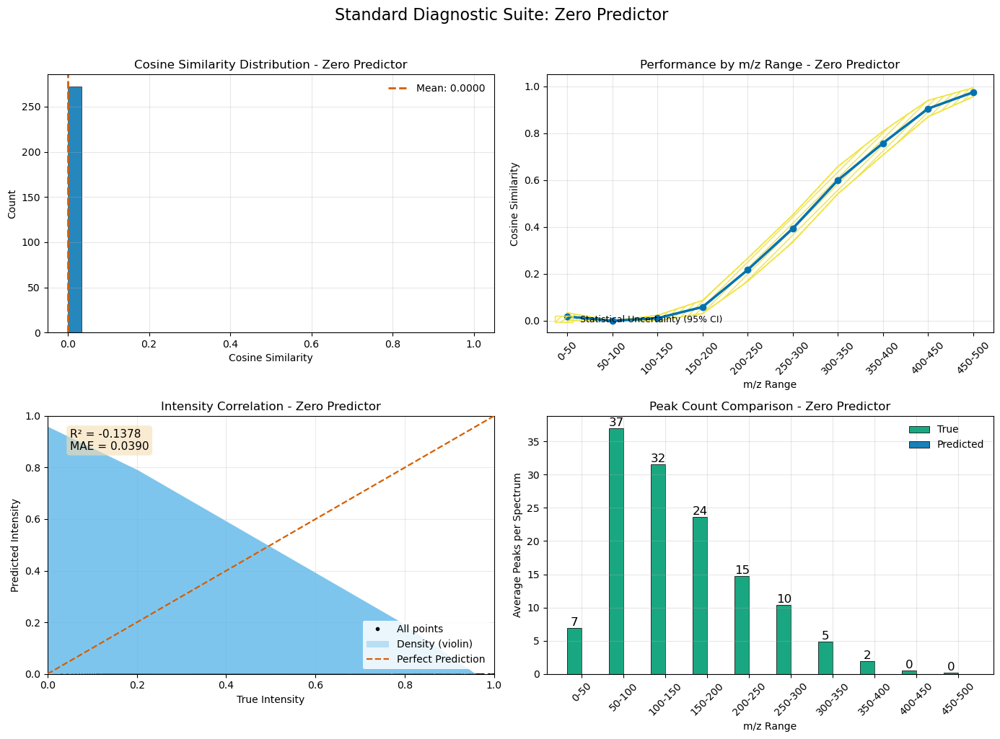


Generating random spectrum examples for Zero Predictor...

Selected random examples:
  1. Index 30: Cosine=0.0000, WDP=0.0000
  2. Index 116: Cosine=0.0000, WDP=0.0000
  3. Index 79: Cosine=0.0000, WDP=0.0000
  4. Index 127: Cosine=0.0000, WDP=0.0000


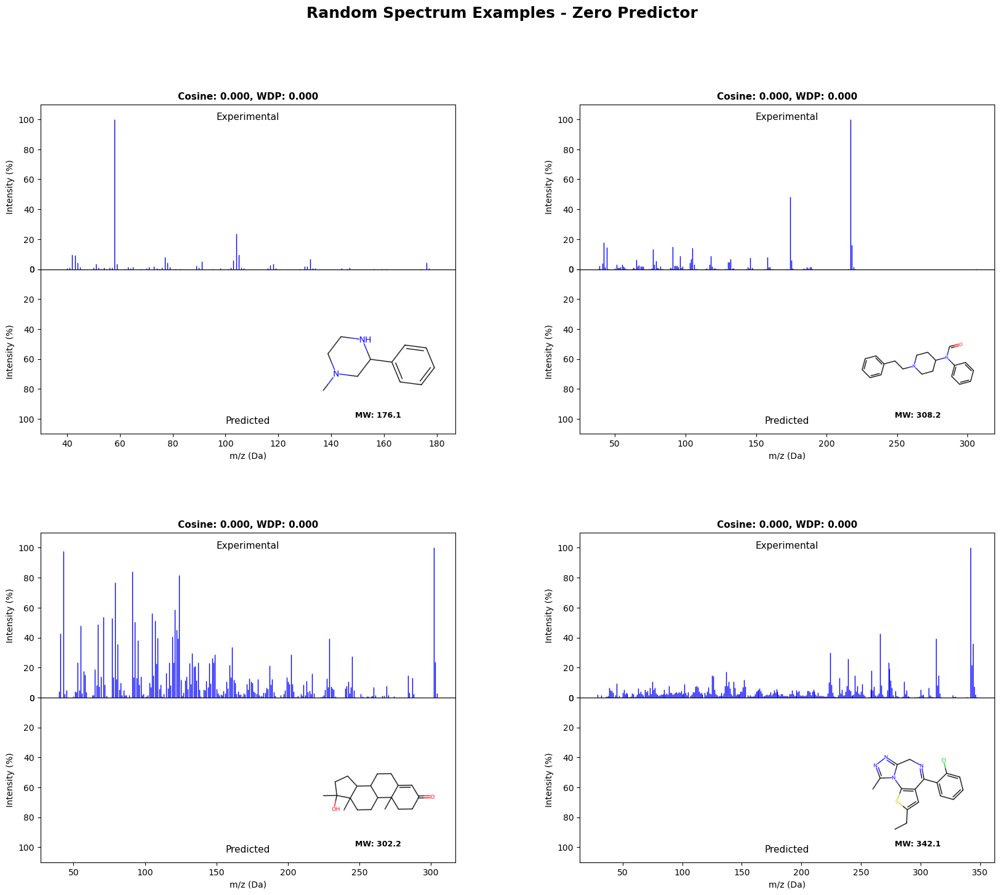


Training Mean Spectrum Predictor...

Mean Spectrum Predictor Performance:
  Cosine Similarity: 0.549347
  MSE: 0.0085
  R² Score: 0.0152
  MAE: 0.0415
  Peak F1: 0.5253
  Training Time: 0.00s

Generating standard diagnostic plots for Mean Spectrum Predictor...


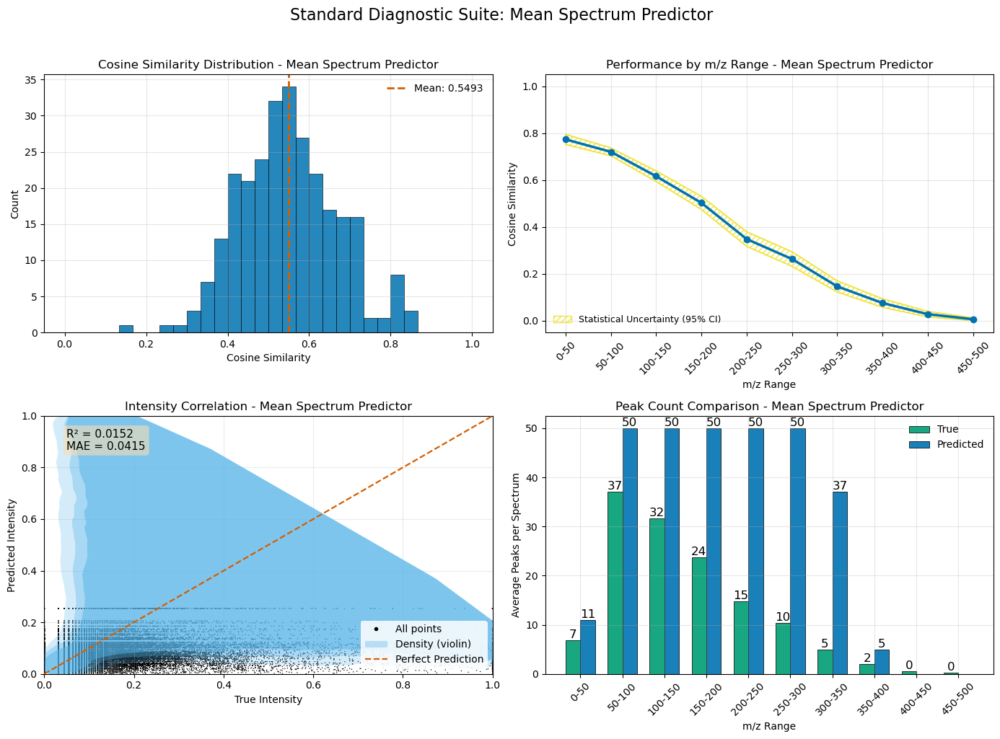


Generating random spectrum examples for Mean Spectrum Predictor...

Selected random examples:
  1. Index 83: Cosine=0.3607, WDP=0.1916
  2. Index 81: Cosine=0.2755, WDP=0.1430
  3. Index 265: Cosine=0.5013, WDP=0.2347
  4. Index 128: Cosine=0.3529, WDP=0.1052


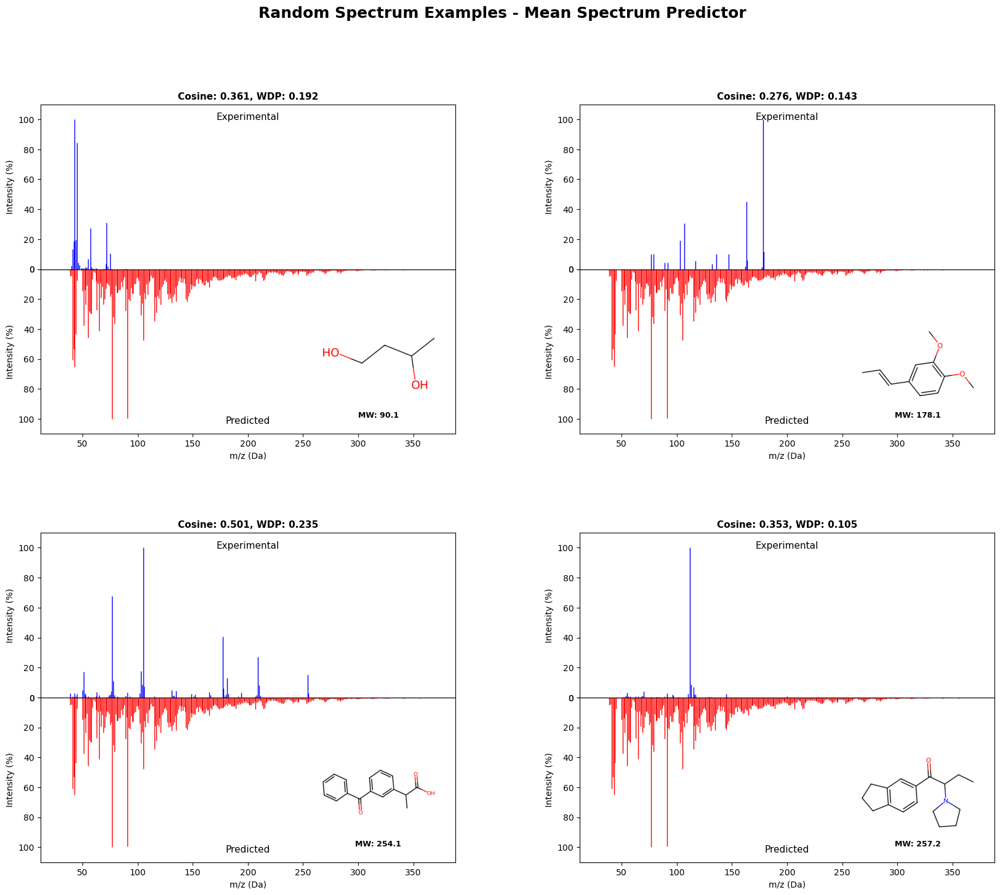


Training Median Spectrum Predictor...

Median Spectrum Predictor Performance:
  Cosine Similarity: 0.494884
  MSE: 0.0096
  R² Score: -0.0011
  MAE: 0.0340
  Peak F1: 0.6288
  Training Time: 0.01s

Generating standard diagnostic plots for Median Spectrum Predictor...


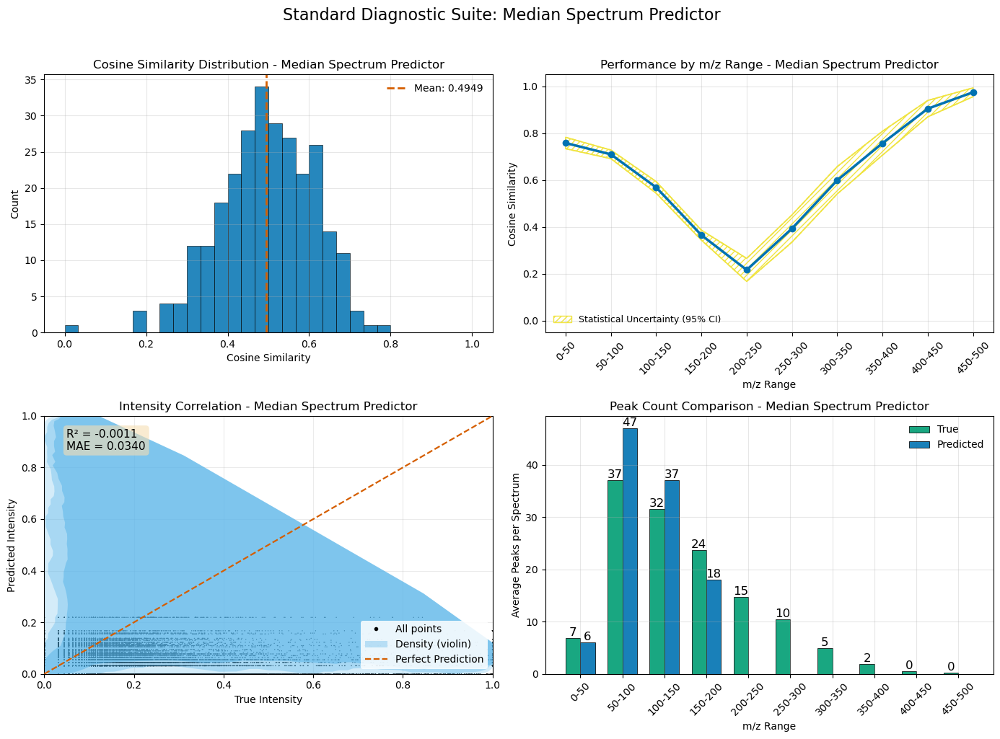


Generating random spectrum examples for Median Spectrum Predictor...

Selected random examples:
  1. Index 80: Cosine=0.4643, WDP=0.0827
  2. Index 129: Cosine=0.3794, WDP=0.0785
  3. Index 208: Cosine=0.2636, WDP=0.0283
  4. Index 241: Cosine=0.4566, WDP=0.0896


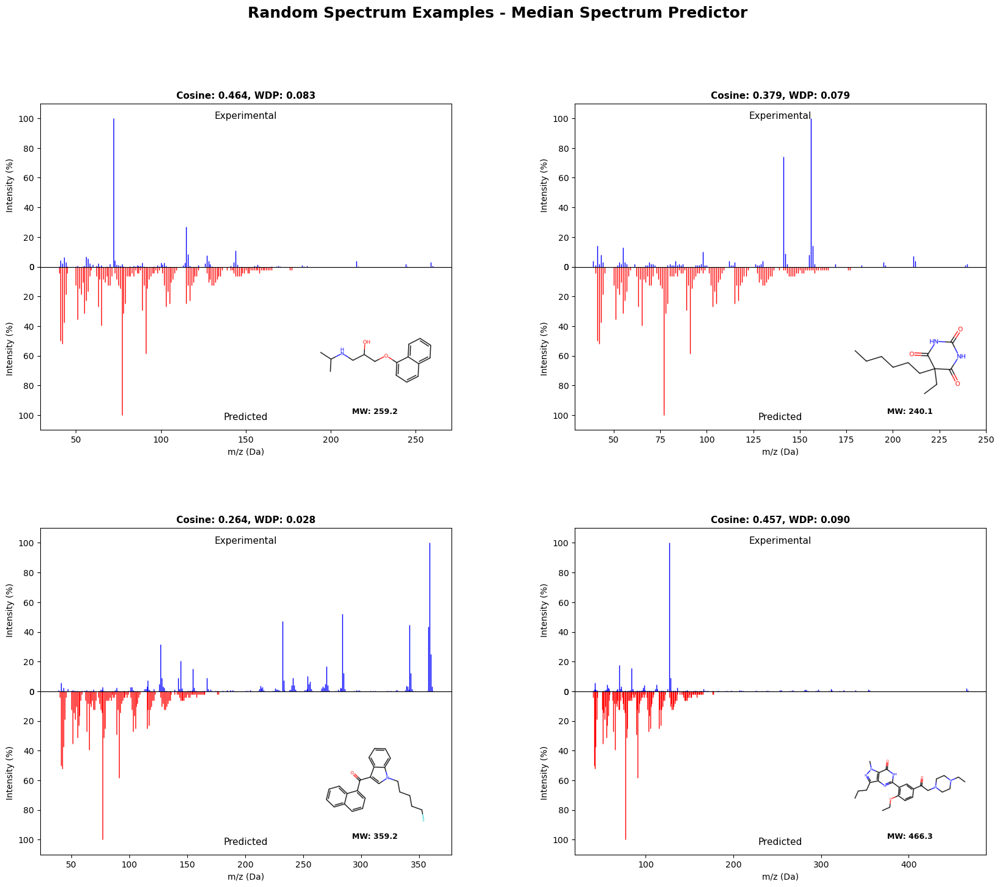


Training Random Noise Predictor...

Random Noise Predictor Performance:
  Cosine Similarity: 0.299010
  MSE: 0.3060
  R² Score: -4664.7364
  MAE: 0.4728
  Peak F1: 0.4166
  Training Time: 0.00s

Generating standard diagnostic plots for Random Noise Predictor...


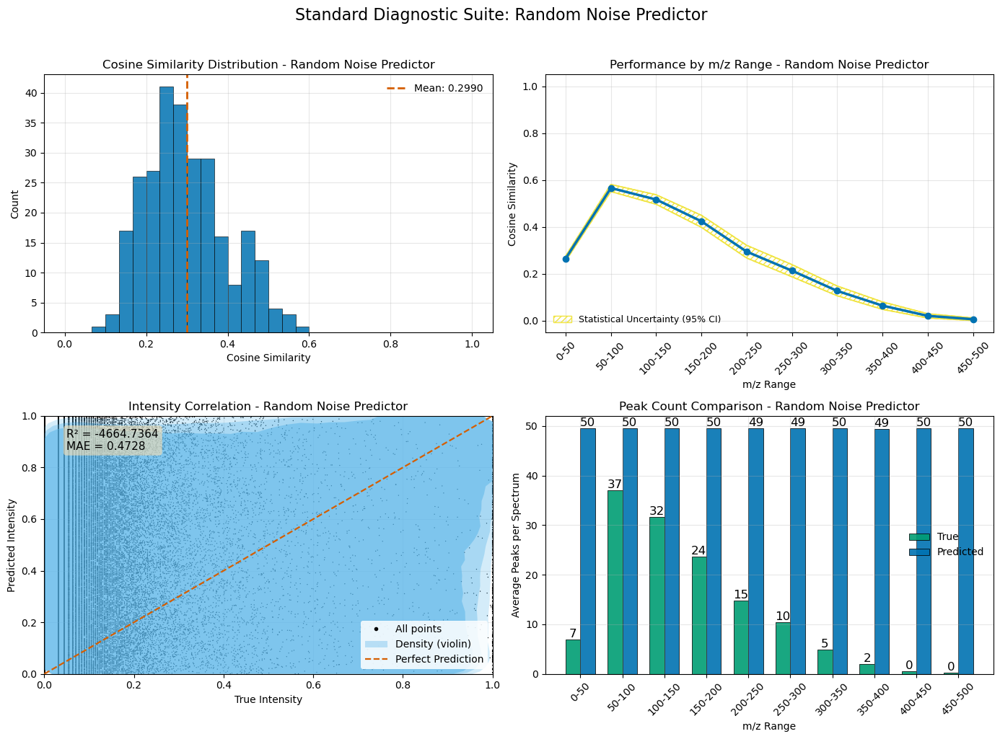


Generating random spectrum examples for Random Noise Predictor...

Selected random examples:
  1. Index 95: Cosine=0.2671, WDP=1.1616
  2. Index 211: Cosine=0.2198, WDP=0.7231
  3. Index 53: Cosine=0.3567, WDP=0.7171
  4. Index 75: Cosine=0.3149, WDP=1.0146


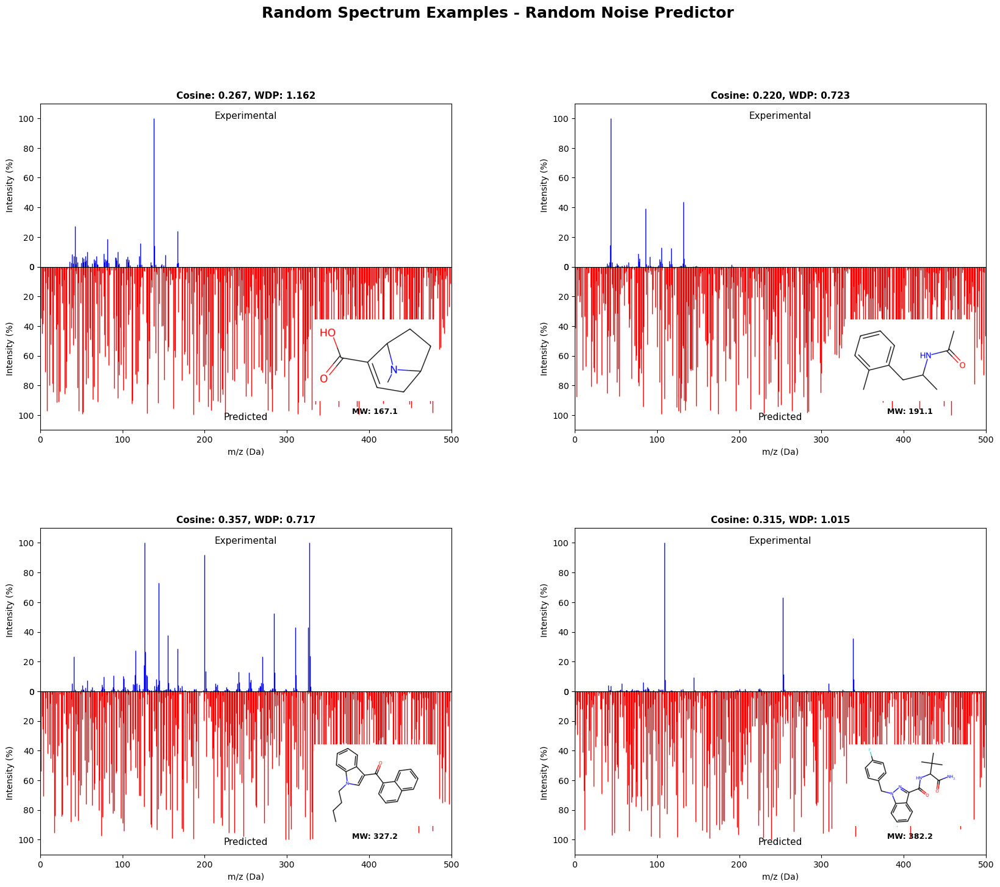


Training Frequency-Weighted Predictor...

Frequency-Weighted Predictor Performance:
  Cosine Similarity: 0.534973
  MSE: 0.0090
  R² Score: -0.0214
  MAE: 0.0352
  Peak F1: 0.6277
  Training Time: 0.00s

Generating standard diagnostic plots for Frequency-Weighted Predictor...


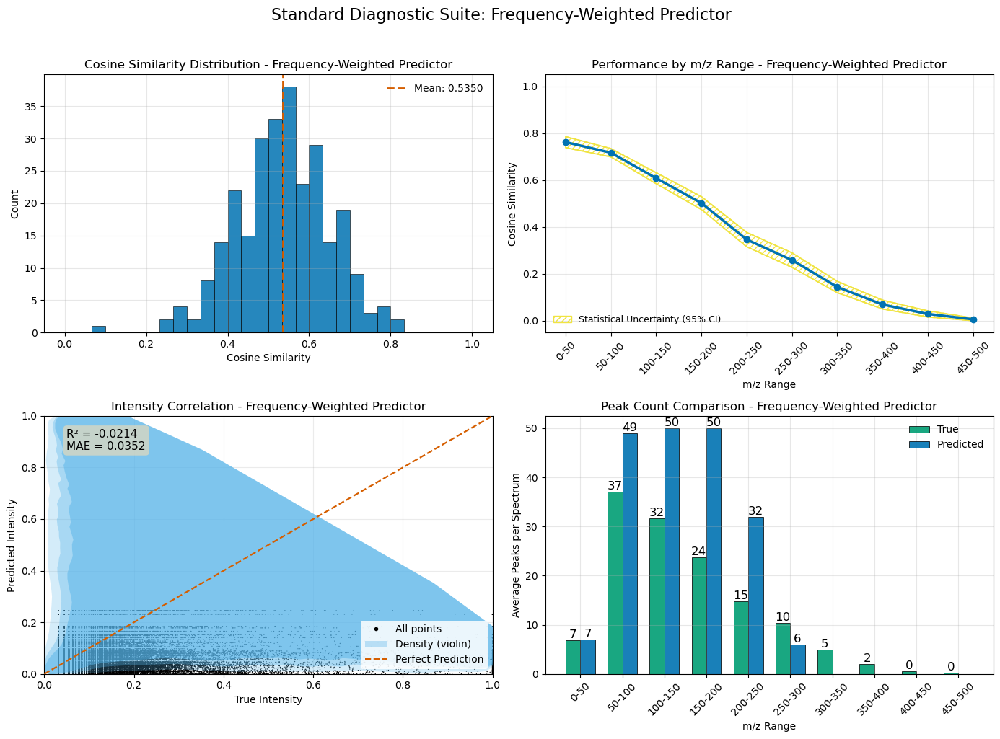


Generating random spectrum examples for Frequency-Weighted Predictor...

Selected random examples:
  1. Index 2: Cosine=0.6206, WDP=0.0913
  2. Index 169: Cosine=0.4820, WDP=0.1266
  3. Index 178: Cosine=0.6348, WDP=0.1439
  4. Index 194: Cosine=0.5848, WDP=0.1096


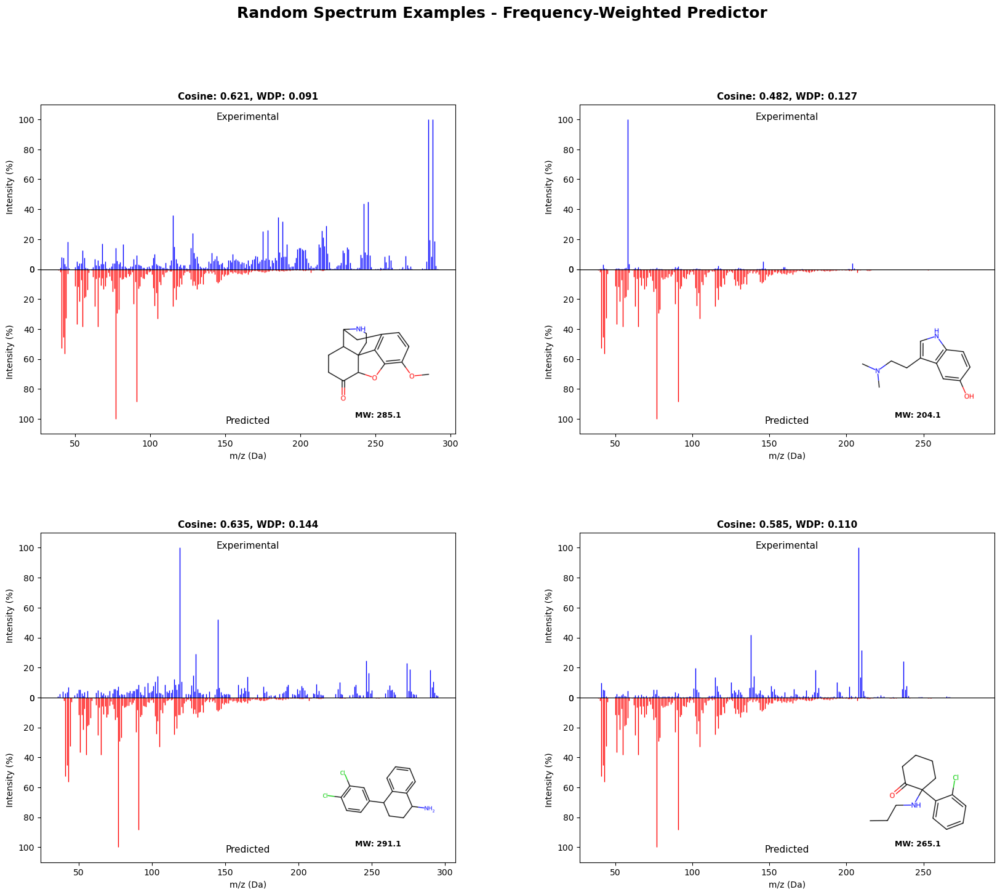


Statistical baselines complete


In [11]:
class ZeroPredictor:
    """Always predicts zero intensity."""
    def __init__(self):
        self.name = "Zero Predictor"
        
    def fit(self, X, y):
        self.output_shape_ = y.shape[1]
        return self
    
    def predict(self, X):
        return np.zeros((X.shape[0], self.output_shape_))

class MeanSpectrumPredictor:
    """Predicts the mean spectrum from training data."""
    def __init__(self):
        self.name = "Mean Spectrum Predictor"
        
    def fit(self, X, y):
        self.mean_spectrum_ = np.mean(y, axis=0)
        return self
    
    def predict(self, X):
        return np.tile(self.mean_spectrum_, (X.shape[0], 1))

class MedianSpectrumPredictor:
    """Predicts the median spectrum from training data."""
    def __init__(self):
        self.name = "Median Spectrum Predictor"
        
    def fit(self, X, y):
        self.median_spectrum_ = np.median(y, axis=0)
        return self
    
    def predict(self, X):
        return np.tile(self.median_spectrum_, (X.shape[0], 1))

class RandomNoisePredictor:
    """Predicts random noise in [0, 1] range."""
    def __init__(self, random_state=42):
        self.name = "Random Noise Predictor"
        self.random_state = random_state
        
    def fit(self, X, y):
        self.output_shape_ = y.shape[1]
        self.rng_ = np.random.RandomState(self.random_state)
        return self
    
    def predict(self, X):
        return self.rng_.rand(X.shape[0], self.output_shape_)

class FrequencyWeightedPredictor:
    """Predicts based on peak frequency in training data."""
    def __init__(self, threshold=0.01):
        self.name = "Frequency-Weighted Predictor"
        self.threshold = threshold
        
    def fit(self, X, y):
        # Calculate peak frequency for each m/z bin
        self.peak_frequency_ = np.mean(y > self.threshold, axis=0)
        self.mean_intensity_ = np.mean(y, axis=0)
        # Weight mean by frequency
        self.weighted_spectrum_ = self.mean_intensity_ * self.peak_frequency_
        return self
    
    def predict(self, X):
        return np.tile(self.weighted_spectrum_, (X.shape[0], 1))

print("TRAINING STATISTICAL BASELINES")
print("=" * 60)

# Load data
datasets = load_all_data(BASELINE_CONFIG)
train_smiles, X_train, y_train = datasets['train']
test_smiles, X_test, y_test = datasets['test']

# Apply transformation
if BASELINE_CONFIG['data']['transform_sqrt']:
    y_train_transformed = np.sqrt(y_train)
    y_test_transformed = np.sqrt(y_test)
else:
    y_train_transformed = y_train
    y_test_transformed = y_test

# Initialize statistical baselines
statistical_models = [
    ZeroPredictor(),
    MeanSpectrumPredictor(),
    MedianSpectrumPredictor(),
    RandomNoisePredictor(BASELINE_CONFIG['data']['random_state']),
    FrequencyWeightedPredictor()
]

statistical_results = []

# Train and evaluate each baseline
for model in statistical_models:
    print(f"\nTraining {model.name}...")
    
    # Time the training
    start_time = time.time()
    model.fit(X_train, y_train_transformed)
    training_time = time.time() - start_time
    
    # Predict
    y_pred = model.predict(X_test)
    y_pred = np.maximum(y_pred, 0)  # Ensure non-negative
    
    # Evaluate
    results = evaluate_baseline_model(
        y_test_transformed, y_pred, model.name, training_time, BASELINE_CONFIG
    )
    
    # Store results
    statistical_results.append(results)
    MODEL_REGISTRY['statistical'].append(results)
    
    # Generate standard plots
    print(f"\nGenerating standard diagnostic plots for {model.name}...")
    visualize_results(results, model_name=model.name, show_uncertainties=True)
    
    # Generate spectrum examples
    print(f"\nGenerating random spectrum examples for {model.name}...")
    create_spectrum_grid(results, test_smiles, n_examples=4, model_name=model.name)

print("\nStatistical baselines complete")

## 6. Linear Methods with Native Multi-Output

These fit all outputs jointly: $X\in\mathbb{R}^{N\times d}$, $Y\in\mathbb{R}^{N\times B}$, $\Beta\in\mathbb{R}^{d\times B}$.

- **OLS**: $$\min_{\Beta} \;\|Y - X\Beta\|_F^2$$
- **Ridge**: $$\min_{\Beta} \;\|Y - X\Beta\|_F^2 + \alpha\|\Beta\|_F^2$$
- **Bayesian Ridge**: Gaussian priors with ARD leading to automatic shrinkage.

```mermaid
flowchart LR
  X["X (scaled)"] --> Fit["Fit OLS/Ridge/Bayes"]
  Y["Y (sqrt)"] --> Fit
  Fit --> B["β (d×B)"]
  B --> Pred["ŷ = Xβ"]
  Pred --> Clip["clip ≥ 0"]
  Clip --> Eval["Metrics & plots"]
```

TRAINING LINEAR METHODS (NATIVE MULTI-OUTPUT)

Training Linear Regression (OLS)...

Linear Regression (OLS) Performance:
  Cosine Similarity: 0.268129
  MSE: 3.3096
  R² Score: -1071.3480
  MAE: 0.4850
  Peak F1: 0.4536
  Training Time: 25.00s

Generating standard diagnostic plots for Linear Regression (OLS)...


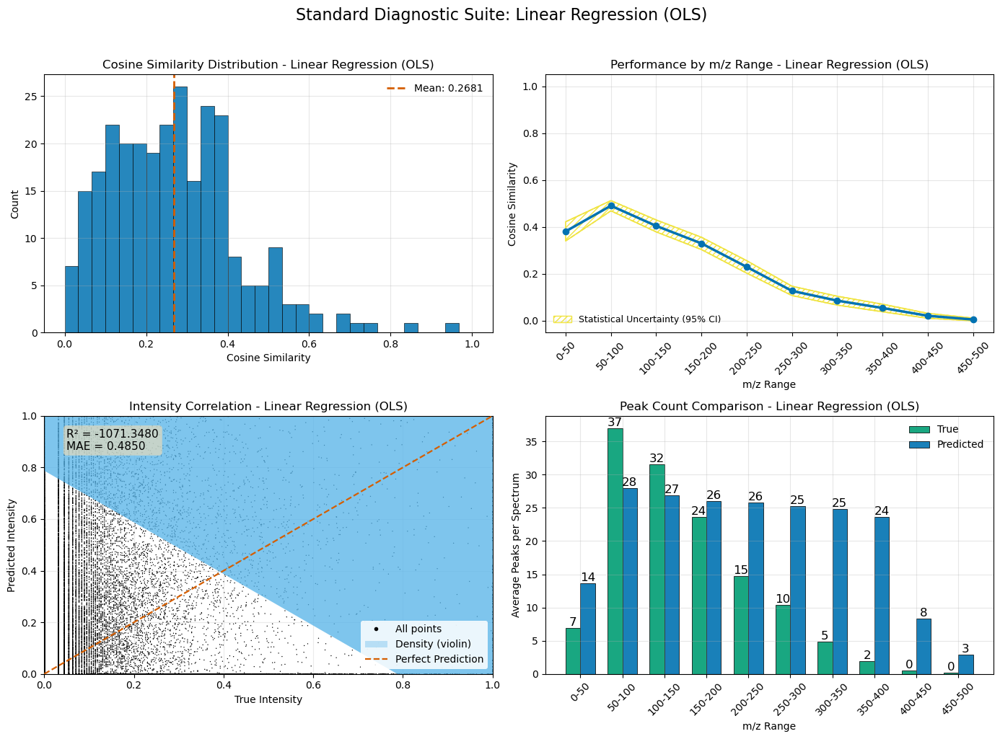


Generating random spectrum examples for Linear Regression (OLS)...

Selected random examples:
  1. Index 22: Cosine=0.1330, WDP=1.0123
  2. Index 86: Cosine=0.1880, WDP=0.9424
  3. Index 248: Cosine=0.5760, WDP=0.9956
  4. Index 202: Cosine=0.3480, WDP=3.0030


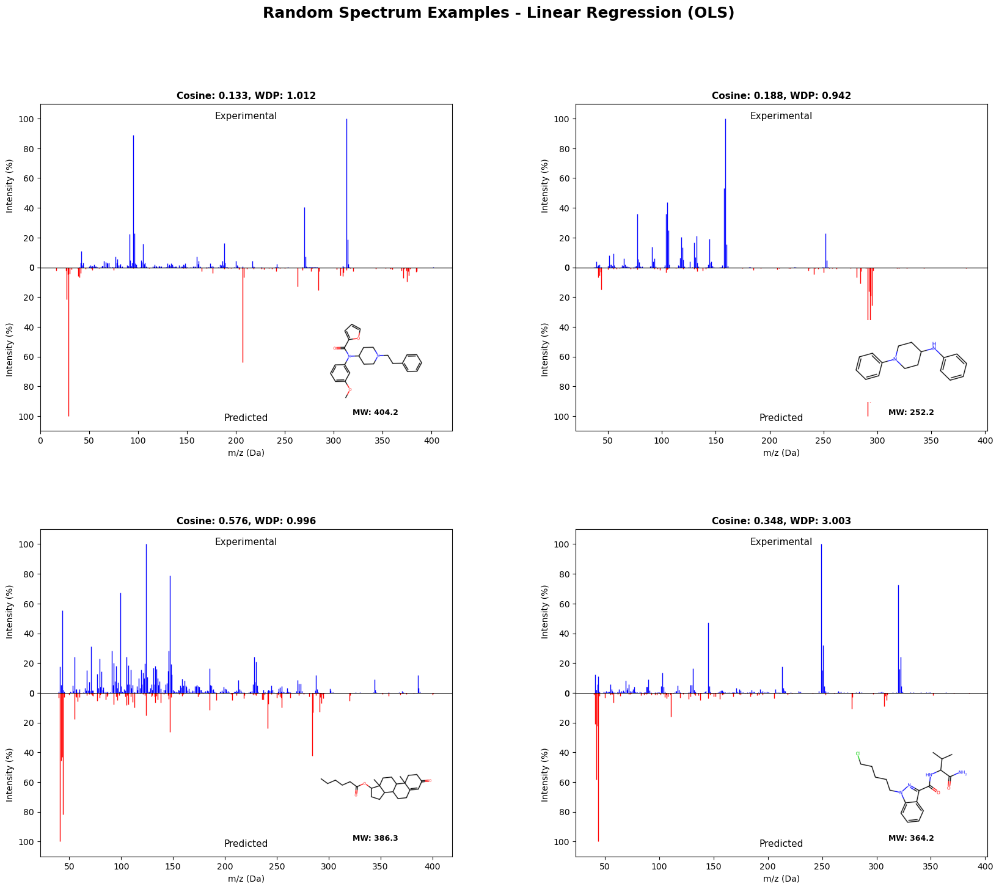


Training Ridge Regression (α=0.1)...

Ridge Regression (α=0.1) Performance:
  Cosine Similarity: 0.572342
  MSE: 0.0267
  R² Score: -12.8694
  MAE: 0.0716
  Peak F1: 0.5428
  Training Time: 0.37s

Generating standard diagnostic plots for Ridge Regression (α=0.1)...


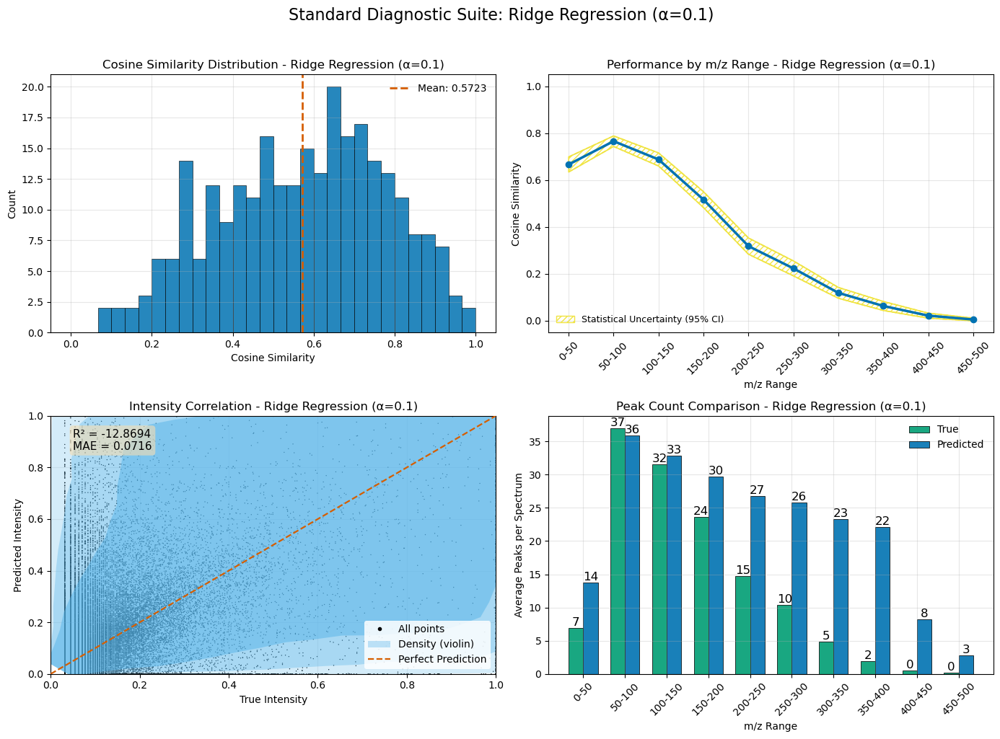


Generating random spectrum examples for Ridge Regression (α=0.1)...

Selected random examples:
  1. Index 34: Cosine=0.5979, WDP=1.0300
  2. Index 47: Cosine=0.6877, WDP=0.5246
  3. Index 33: Cosine=0.7868, WDP=0.8824
  4. Index 166: Cosine=0.6435, WDP=0.5937


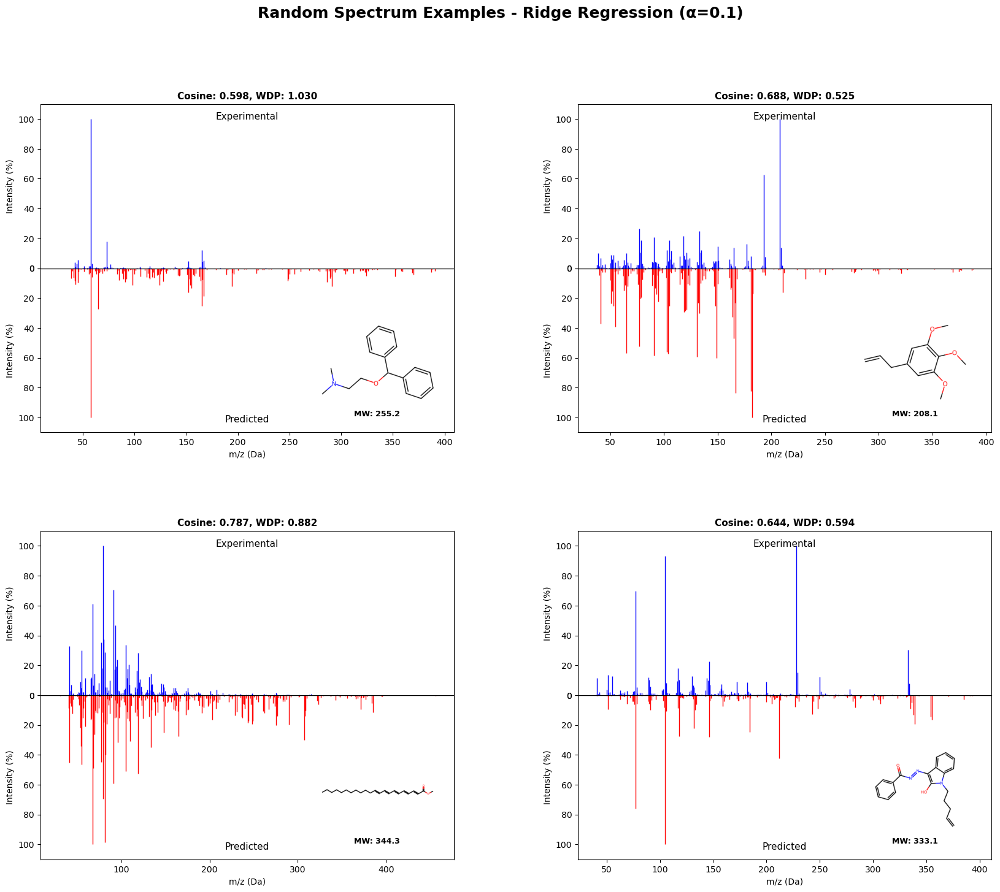


Training Ridge Regression (α=1.0)...

Ridge Regression (α=1.0) Performance:
  Cosine Similarity: 0.637391
  MSE: 0.0151
  R² Score: -6.0497
  MAE: 0.0550
  Peak F1: 0.5644
  Training Time: 0.46s

Generating standard diagnostic plots for Ridge Regression (α=1.0)...


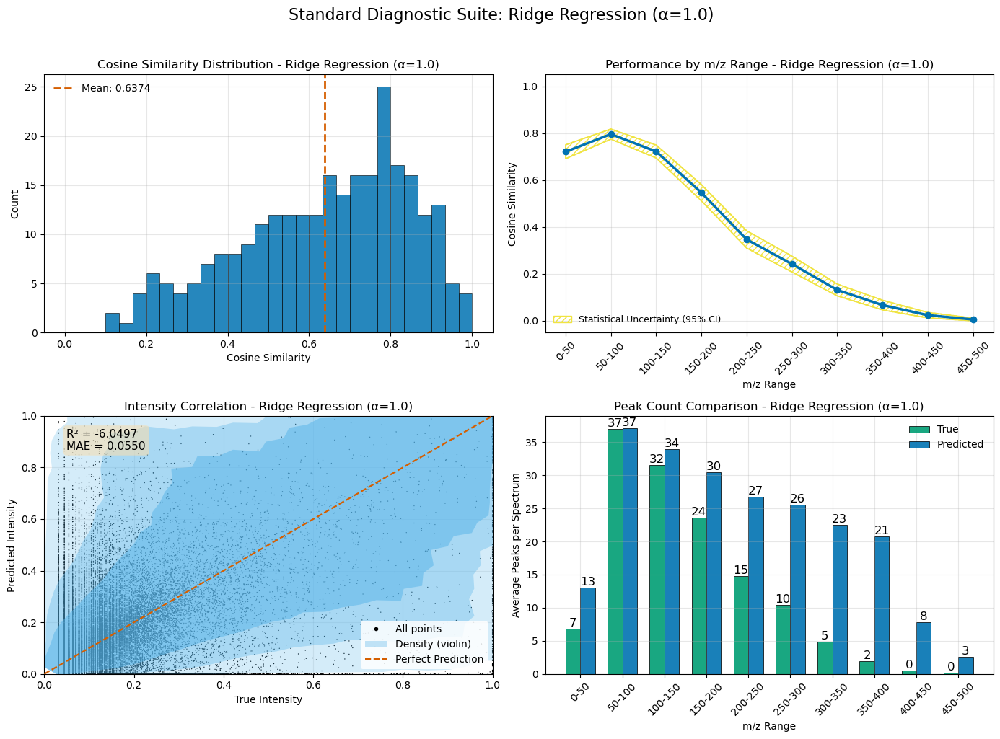


Generating random spectrum examples for Ridge Regression (α=1.0)...

Selected random examples:
  1. Index 23: Cosine=0.8957, WDP=0.9150
  2. Index 178: Cosine=0.5514, WDP=0.6201
  3. Index 195: Cosine=0.5594, WDP=0.7535
  4. Index 226: Cosine=0.3837, WDP=0.6458


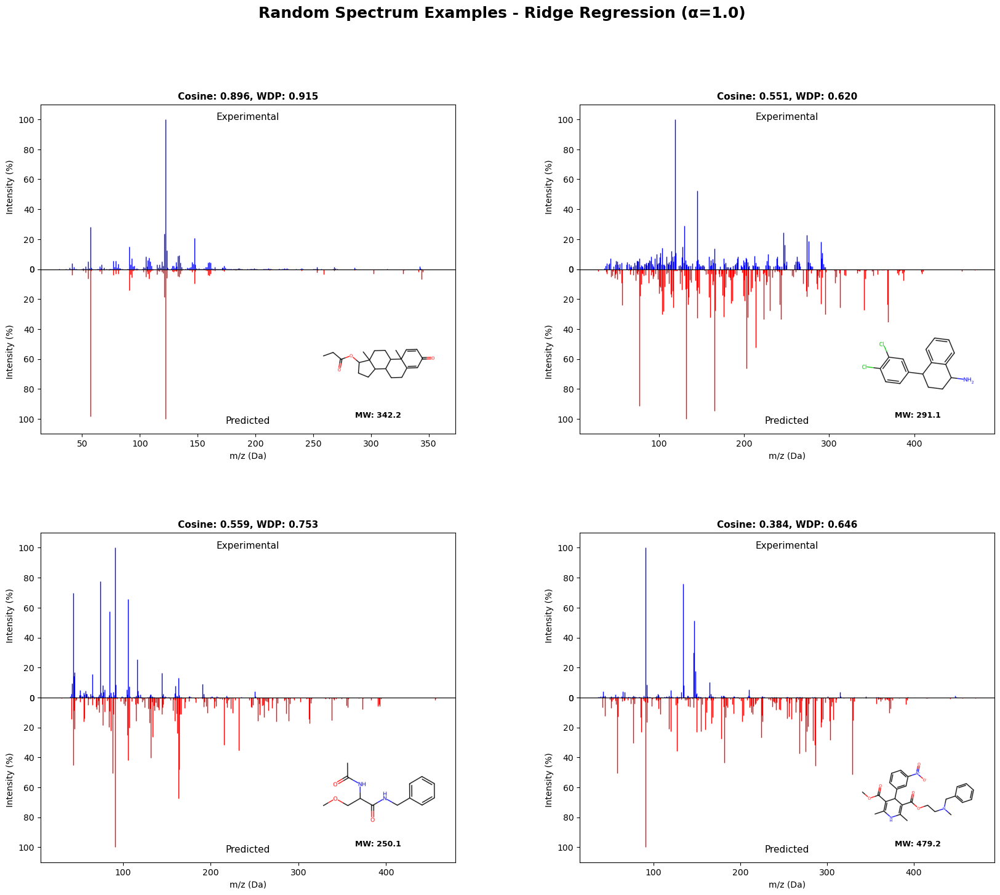


Training Ridge Regression (α=10.0)...

Ridge Regression (α=10.0) Performance:
  Cosine Similarity: 0.696935
  MSE: 0.0091
  R² Score: -2.6373
  MAE: 0.0417
  Peak F1: 0.5960
  Training Time: 0.53s

Generating standard diagnostic plots for Ridge Regression (α=10.0)...


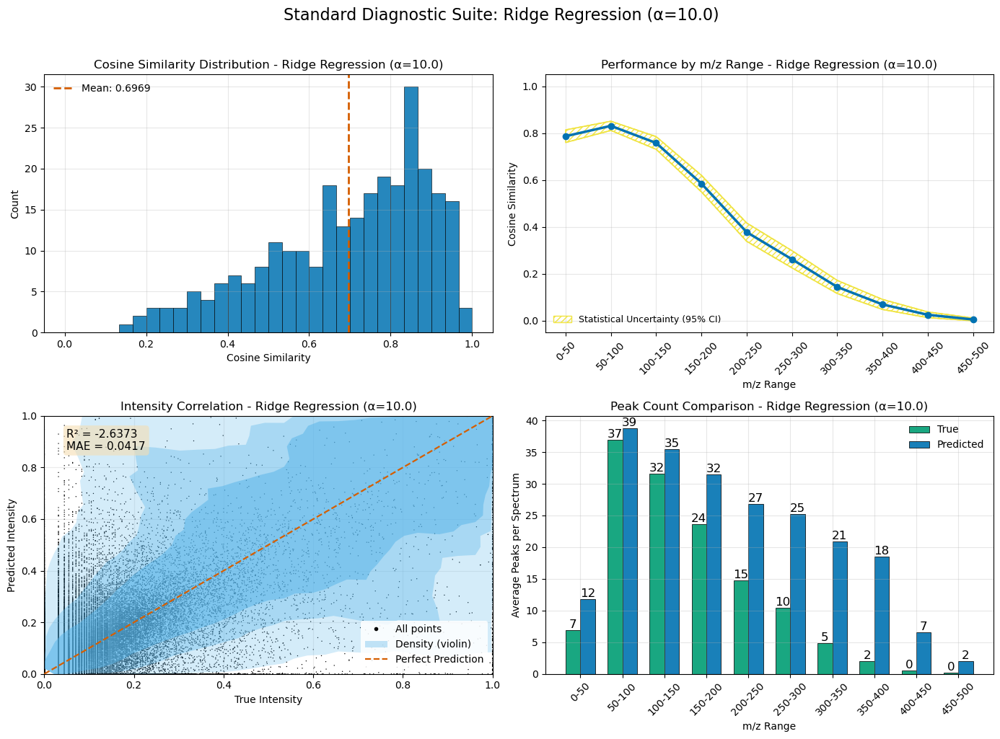


Generating random spectrum examples for Ridge Regression (α=10.0)...

Selected random examples:
  1. Index 267: Cosine=0.6507, WDP=0.5967
  2. Index 28: Cosine=0.4055, WDP=0.3850
  3. Index 52: Cosine=0.5096, WDP=0.3837
  4. Index 93: Cosine=0.7347, WDP=1.0964


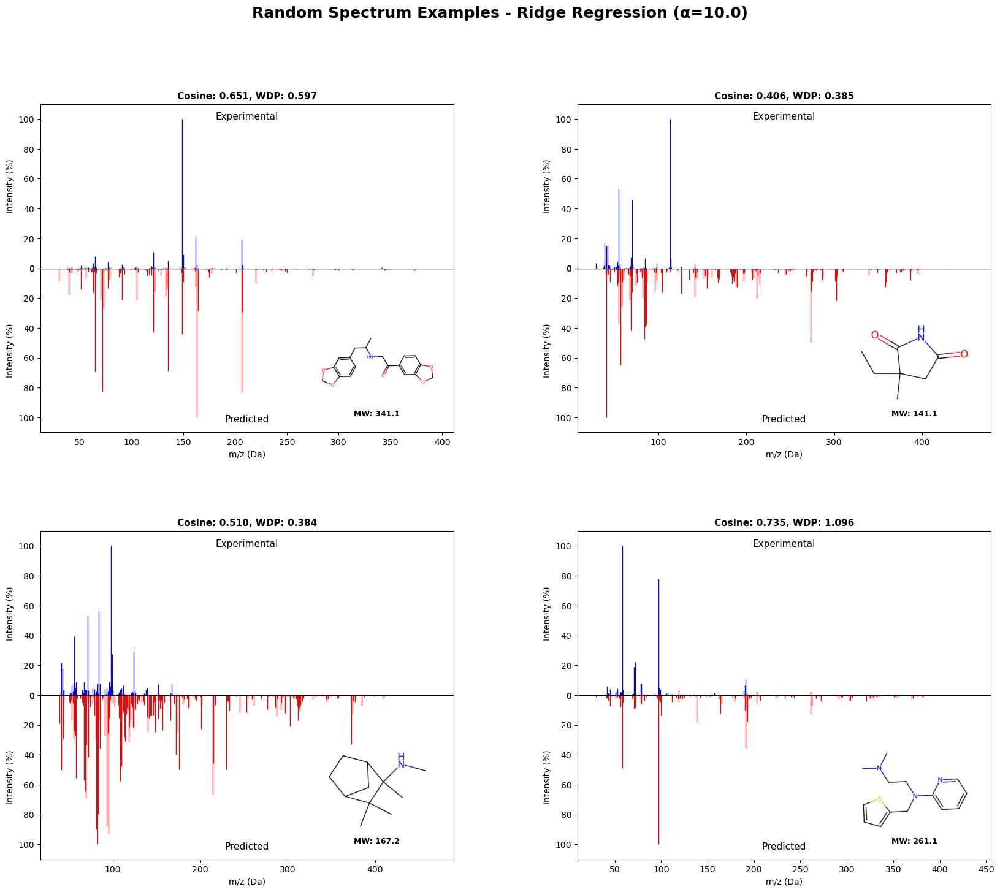


Training Bayesian Ridge...
  Error training Bayesian Ridge: y should be a 1d array, got an array of shape (2176, 500) instead.

Linear methods complete


In [12]:
print("TRAINING LINEAR METHODS (NATIVE MULTI-OUTPUT)")
print("=" * 60)

# Apply feature scaling
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Define linear models with native multi-output support
linear_models = [
    ("Linear Regression (OLS)", 
     LinearRegression()),
    
    ("Ridge Regression (α=0.1)", 
     Ridge(alpha=0.1)),
    
    ("Ridge Regression (α=1.0)", 
     Ridge(alpha=BASELINE_CONFIG['linear']['ridge_alpha'])),
    
    ("Ridge Regression (α=10.0)", 
     Ridge(alpha=10.0)),
    
    ("Bayesian Ridge", 
     BayesianRidge(max_iter=BASELINE_CONFIG['linear']['bayesian_max_iter']))
]

linear_results = []

# Train and evaluate each model
for model_name, model in linear_models:
    print(f"\nTraining {model_name}...")
    
    try:
        # Time the training
        start_time = time.time()
        model.fit(X_train_scaled, y_train_transformed)
        training_time = time.time() - start_time
        
        # Predict
        y_pred = model.predict(X_test_scaled)
        y_pred = np.maximum(y_pred, 0)  # Ensure non-negative
        
        # Evaluate
        results = evaluate_baseline_model(
            y_test_transformed, y_pred, model_name, training_time, BASELINE_CONFIG
        )
        
        # Estimate model size
        results['model_size_mb'] = estimate_model_size(model)
        
        # Store results
        linear_results.append(results)
        MODEL_REGISTRY['linear'].append(results)
        
        # Generate standard plots
        print(f"\nGenerating standard diagnostic plots for {model_name}...")
        visualize_results(results, model_name=model_name, show_uncertainties=True)
        
        # Generate spectrum examples
        print(f"\nGenerating random spectrum examples for {model_name}...")
        create_spectrum_grid(results, test_smiles, n_examples=4, model_name=model_name)
        
    except Exception as e:
        print(f"  Error training {model_name}: {str(e)}")
        continue

print("\nLinear methods complete")

## 7. Nearest Neighbor Methods

Native multi-output KNN averages neighbor spectra per query.

$$\hat{\mathbf{y}}(x) = \sum_{i \in N_k(x)} w_i(x)\,\mathbf{y}_i,\quad w_i=\frac{\kappa(d(x,x_i))}{\sum_j \kappa(d(x,x_j))}$$
where $\kappa$ is either uniform or distance weighting.

```mermaid
flowchart LR
  Xq["Query x"] --> NN["Find N_k(x)"]
  NN --> Weights["Compute weights w_i"]
  Weights --> Avg["Weighted average of y_i"]
  Avg --> O["ŷ"]
```

Multiple k values are tried to balance bias–variance.

TRAINING NEAREST NEIGHBOR METHODS

Training KNN Regression (k=5)...

KNN Regression (k=5) Performance:
  Cosine Similarity: 0.713935
  MSE: 0.0054
  R² Score: 0.0628
  MAE: 0.0258
  Peak F1: 0.7557
  Training Time: 0.00s

Generating standard diagnostic plots for KNN Regression (k=5)...


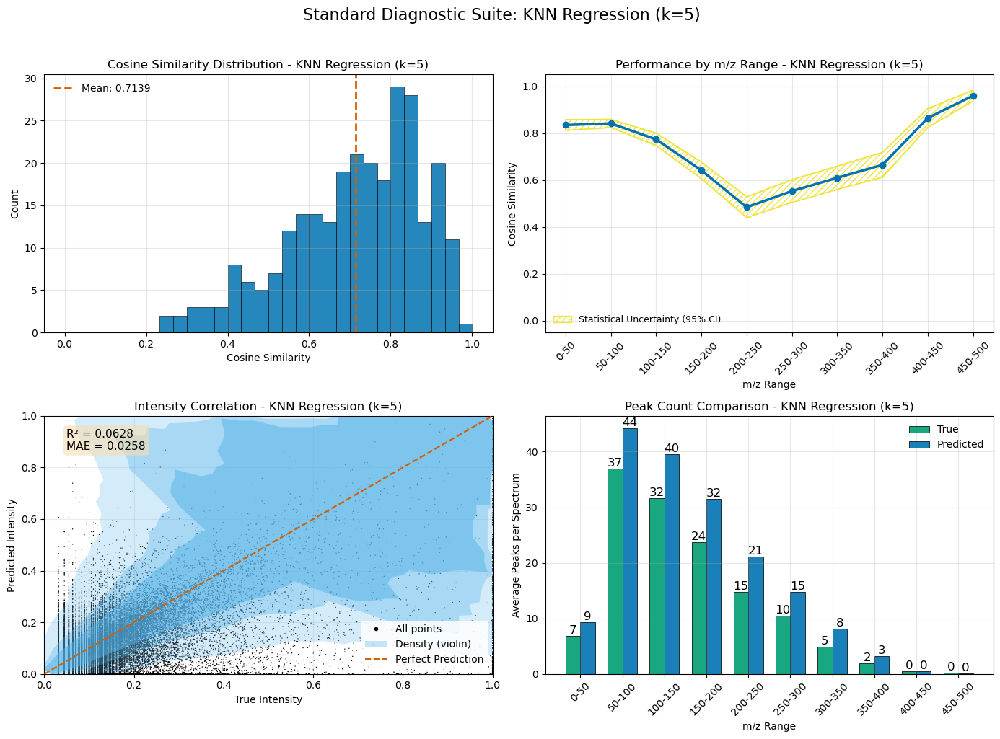


Generating random spectrum examples for KNN Regression (k=5)...

Selected random examples:
  1. Index 127: Cosine=0.8301, WDP=0.5340
  2. Index 173: Cosine=0.8457, WDP=0.6143
  3. Index 99: Cosine=0.8245, WDP=0.4635
  4. Index 271: Cosine=0.9156, WDP=0.6300


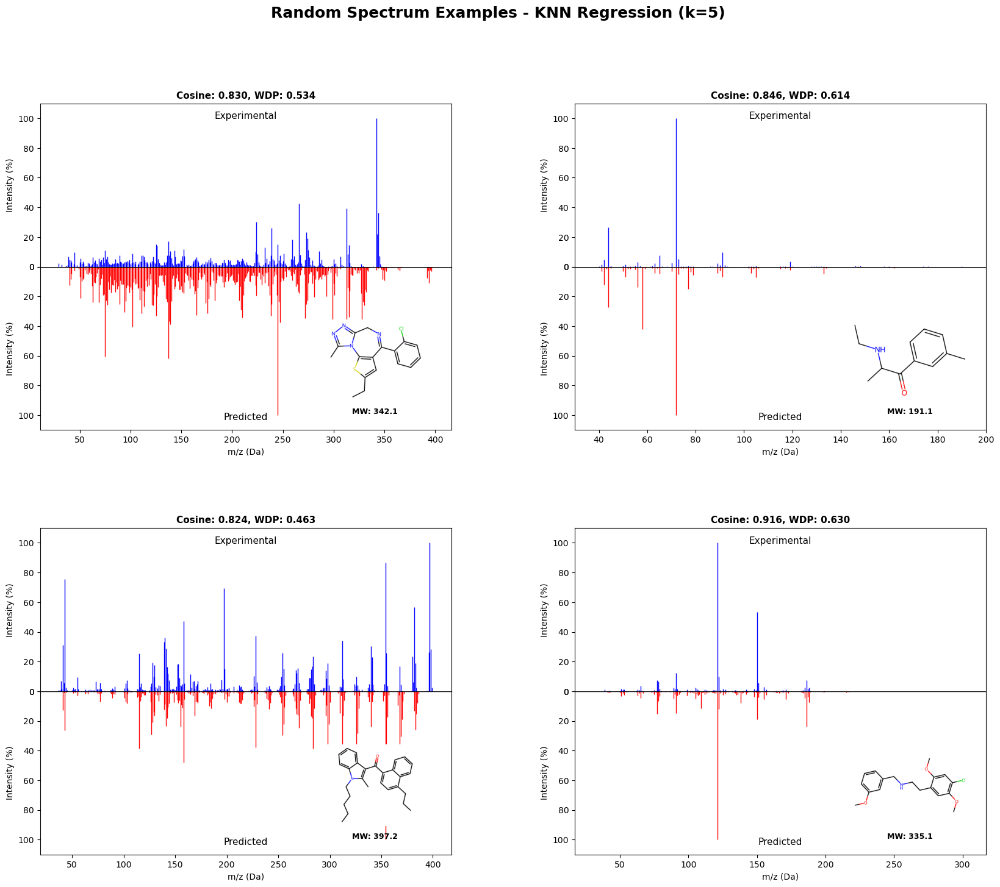


Training KNN Regression (k=10)...

KNN Regression (k=10) Performance:
  Cosine Similarity: 0.712763
  MSE: 0.0054
  R² Score: 0.0983
  MAE: 0.0263
  Peak F1: 0.7349
  Training Time: 0.00s

Generating standard diagnostic plots for KNN Regression (k=10)...


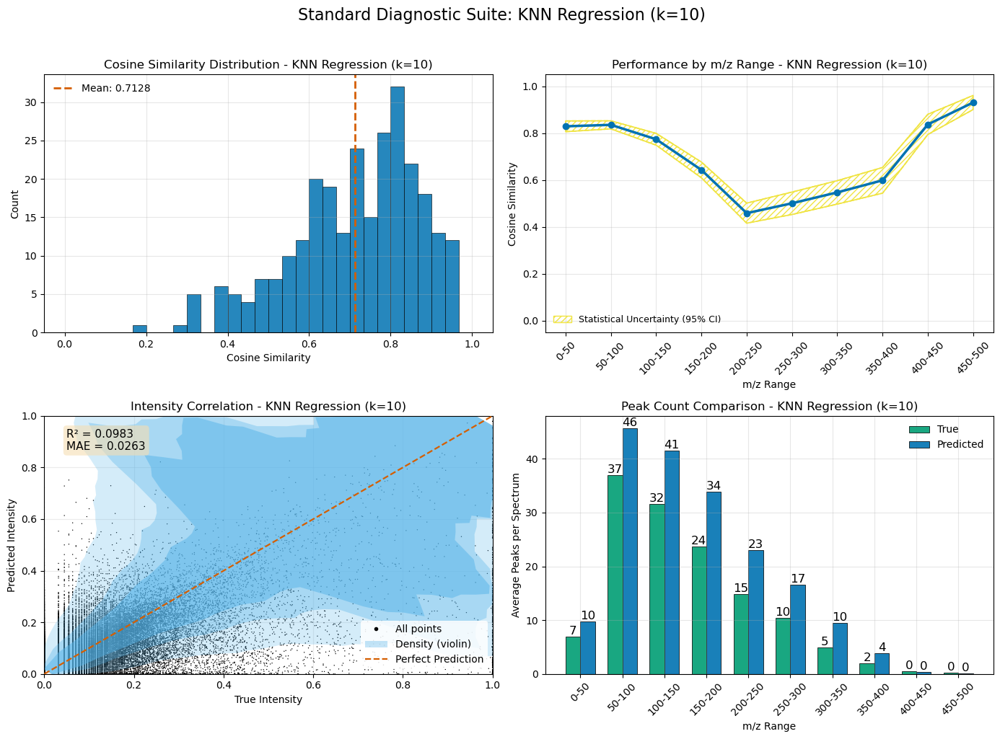


Generating random spectrum examples for KNN Regression (k=10)...

Selected random examples:
  1. Index 28: Cosine=0.5663, WDP=0.2469
  2. Index 252: Cosine=0.7004, WDP=0.4338
  3. Index 213: Cosine=0.7718, WDP=0.4408
  4. Index 12: Cosine=0.7326, WDP=0.3026


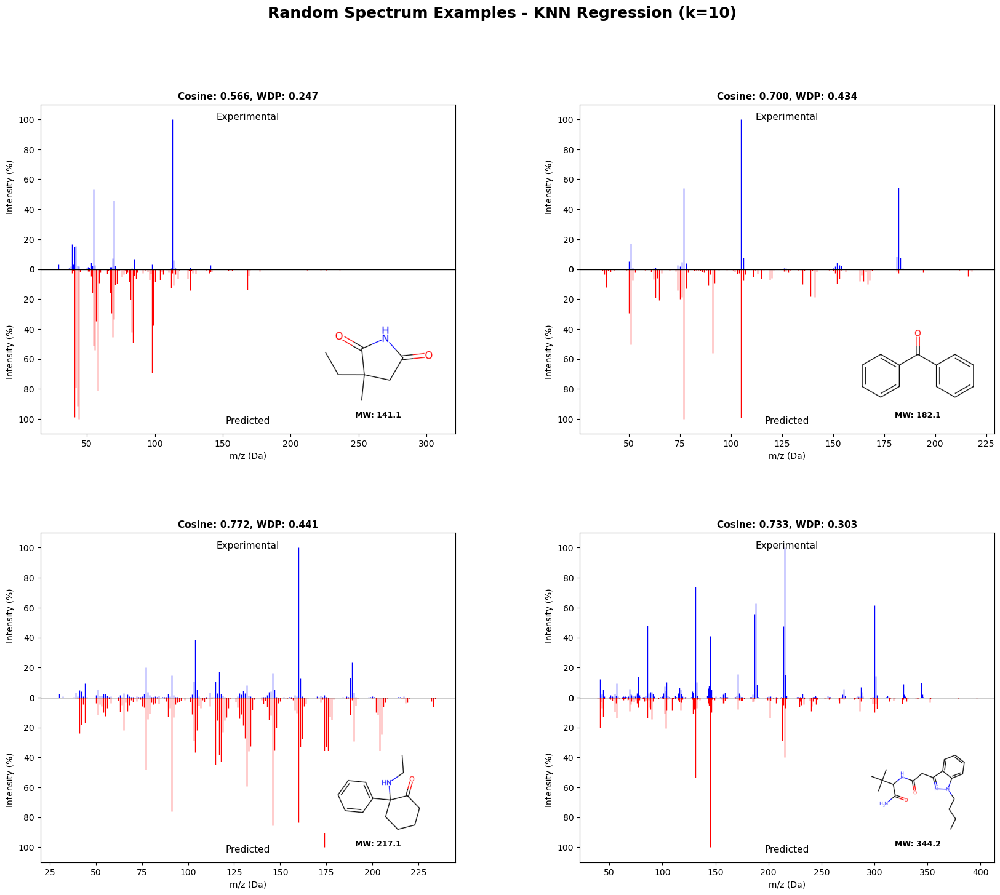


Training KNN Regression (k=20)...

KNN Regression (k=20) Performance:
  Cosine Similarity: 0.698089
  MSE: 0.0055
  R² Score: 0.1760
  MAE: 0.0270
  Peak F1: 0.7154
  Training Time: 0.00s

Generating standard diagnostic plots for KNN Regression (k=20)...


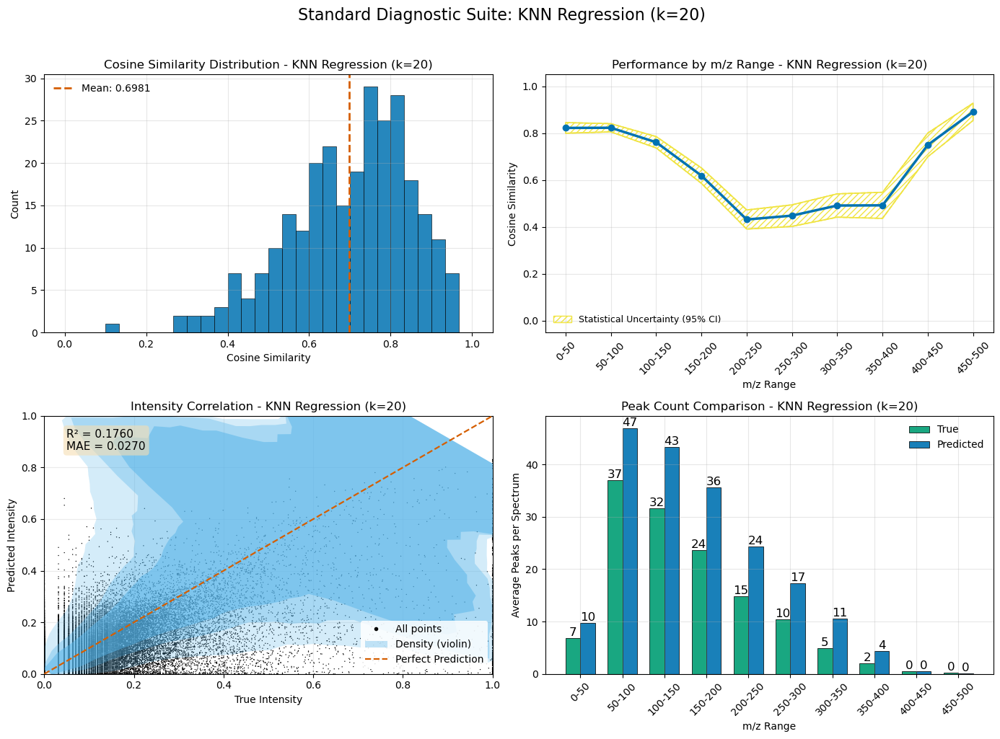


Generating random spectrum examples for KNN Regression (k=20)...

Selected random examples:
  1. Index 198: Cosine=0.8867, WDP=0.7382
  2. Index 207: Cosine=0.5241, WDP=0.1770
  3. Index 42: Cosine=0.7592, WDP=0.3841
  4. Index 156: Cosine=0.8542, WDP=0.4335


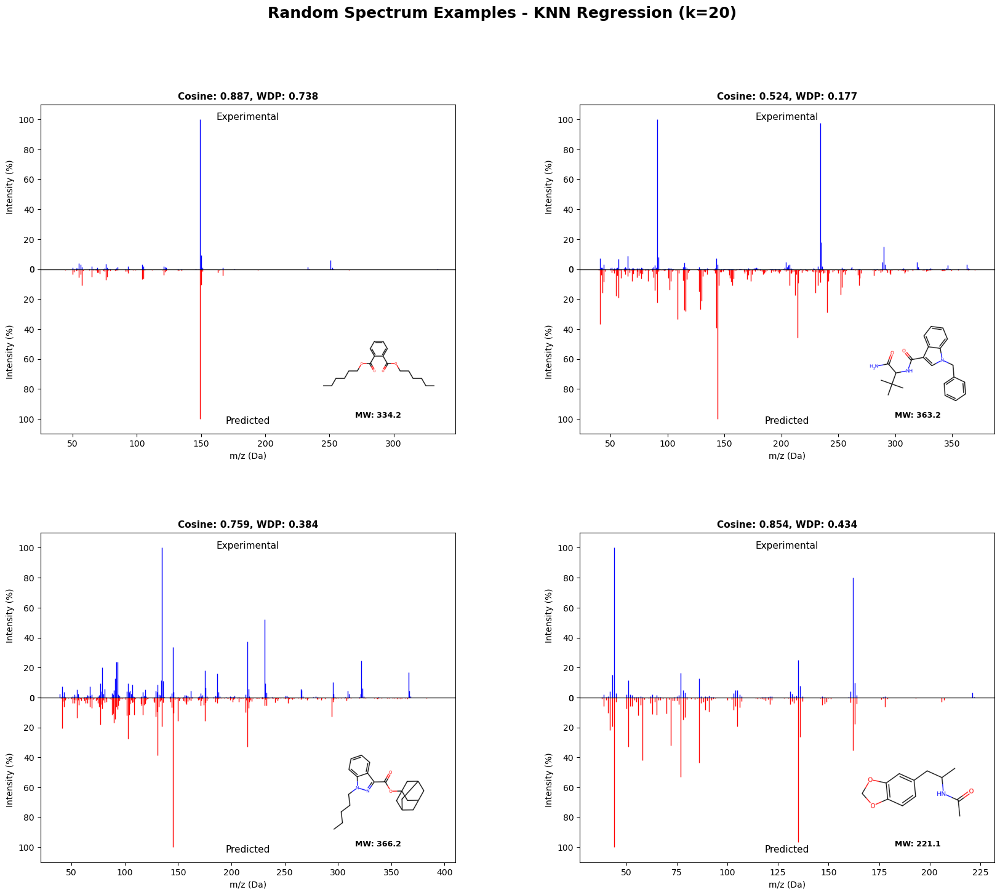


Training KNN Regression (k=10, uniform)...

KNN Regression (k=10, uniform) Performance:
  Cosine Similarity: 0.702552
  MSE: 0.0055
  R² Score: 0.0589
  MAE: 0.0269
  Peak F1: 0.7325
  Training Time: 0.00s

Generating standard diagnostic plots for KNN Regression (k=10, uniform)...


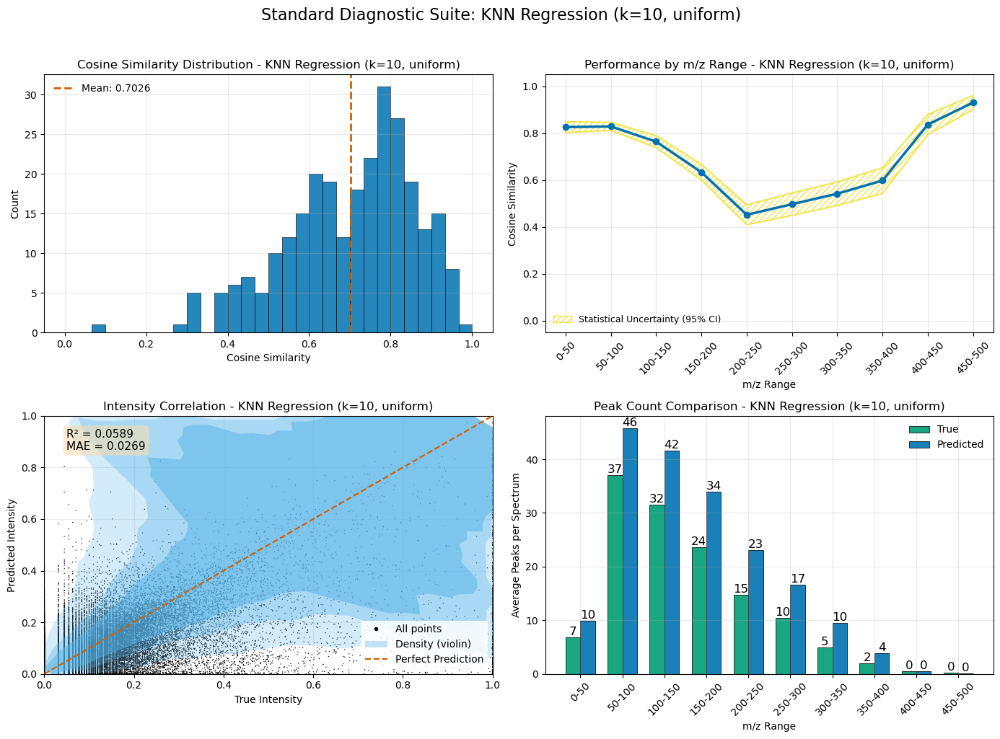


Generating random spectrum examples for KNN Regression (k=10, uniform)...

Selected random examples:
  1. Index 53: Cosine=0.8469, WDP=0.5561
  2. Index 225: Cosine=0.8244, WDP=0.4906
  3. Index 170: Cosine=0.7229, WDP=0.2870
  4. Index 15: Cosine=0.7493, WDP=0.3973


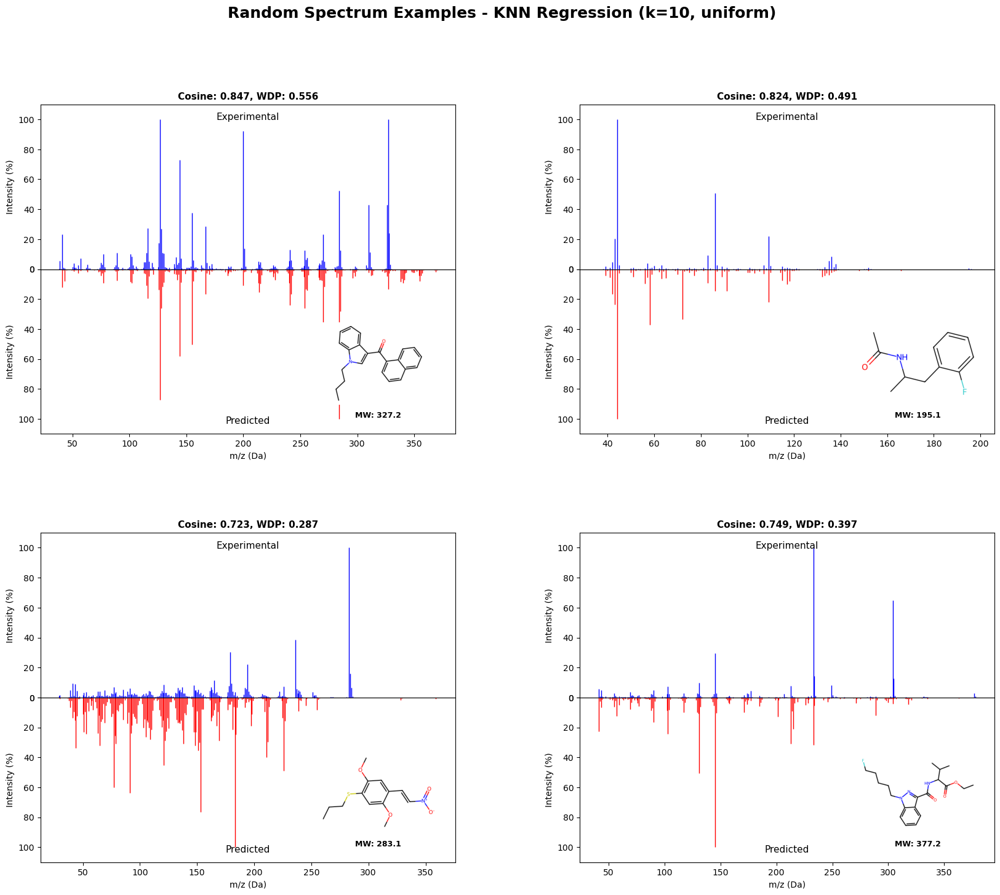


Training Radius Neighbors Regression...

Radius Neighbors Regression Performance:
  Cosine Similarity: 0.561365
  MSE: 0.0083
  R² Score: 0.0325
  MAE: 0.0400
  Peak F1: 0.5323
  Training Time: 0.00s

Generating standard diagnostic plots for Radius Neighbors Regression...


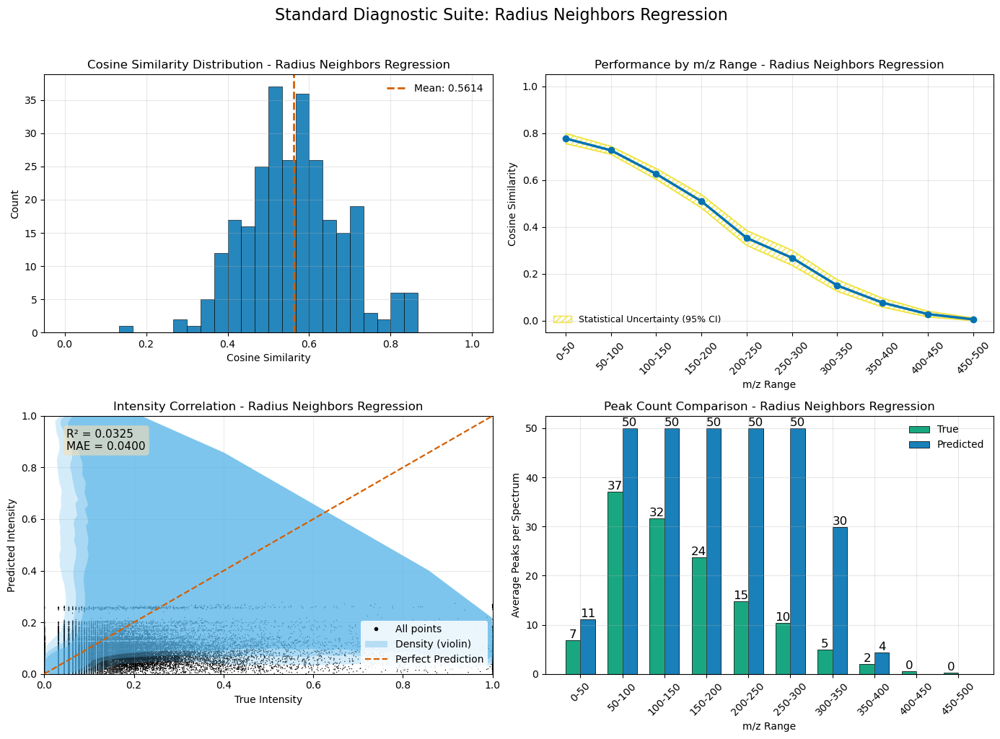


Generating random spectrum examples for Radius Neighbors Regression...

Selected random examples:
  1. Index 227: Cosine=0.5402, WDP=0.1744
  2. Index 79: Cosine=0.8465, WDP=0.2013
  3. Index 220: Cosine=0.6280, WDP=0.1831
  4. Index 261: Cosine=0.7040, WDP=0.2397


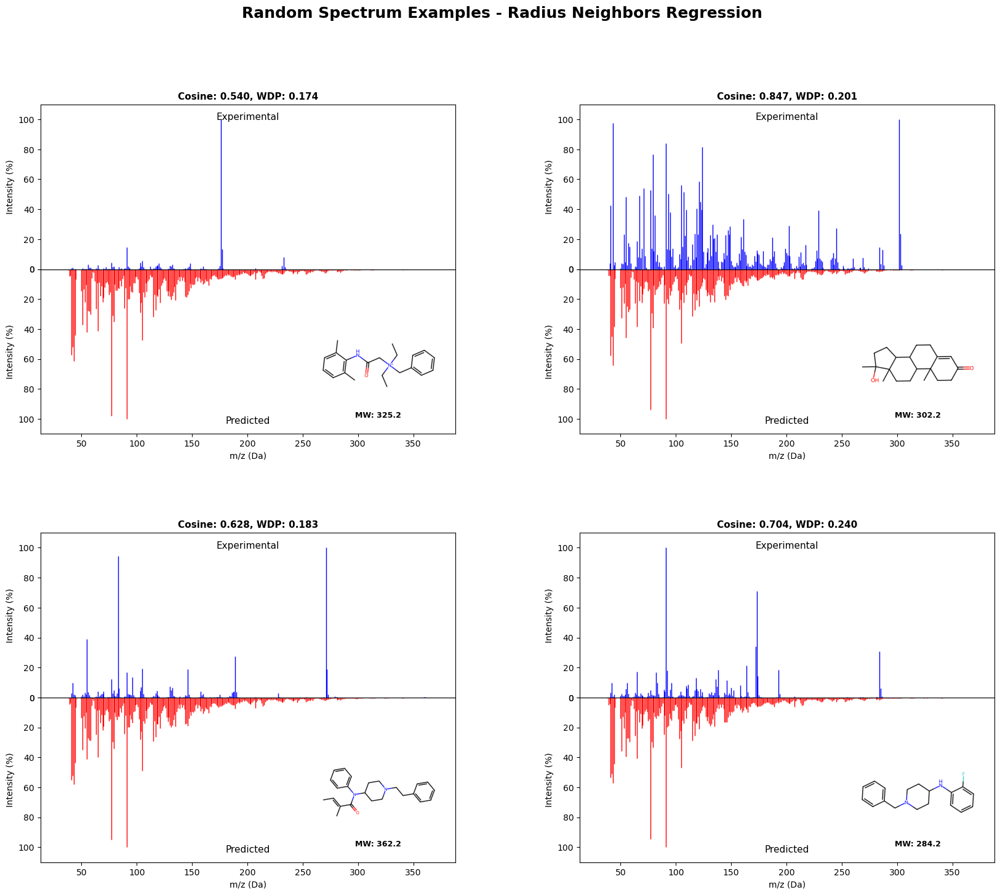


Nearest neighbor methods complete


In [13]:
print("TRAINING NEAREST NEIGHBOR METHODS")
print("=" * 60)

# Define neighbor-based models
neighbor_models = []

# Multiple k values for KNN
for k in BASELINE_CONFIG['neighbors']['knn_neighbors']:
    neighbor_models.append(
        (f"KNN Regression (k={k})", 
         KNeighborsRegressor(
             n_neighbors=k,
             weights=BASELINE_CONFIG['neighbors']['knn_weights'],
             n_jobs=BASELINE_CONFIG['neighbors']['n_jobs']))
    )

# Add uniform weighting variant
neighbor_models.append(
    ("KNN Regression (k=10, uniform)", 
     KNeighborsRegressor(
         n_neighbors=10,
         weights='uniform',
         n_jobs=BASELINE_CONFIG['neighbors']['n_jobs']))
)

# Add Radius Neighbors for small datasets
if len(X_train) < 10000:
    neighbor_models.append(
        ("Radius Neighbors Regression",
         RadiusNeighborsRegressor(
             radius=BASELINE_CONFIG['neighbors']['radius'],
             weights='distance'))
    )

neighbor_results = []

# Train and evaluate each model
for model_name, model in neighbor_models:
    print(f"\nTraining {model_name}...")
    
    try:
        # Time the training
        start_time = time.time()
        model.fit(X_train_scaled, y_train_transformed)
        training_time = time.time() - start_time
        
        # Predict
        y_pred = model.predict(X_test_scaled)
        y_pred = np.maximum(y_pred, 0)  # Ensure non-negative
        
        # Evaluate
        results = evaluate_baseline_model(
            y_test_transformed, y_pred, model_name, training_time, BASELINE_CONFIG
        )
        
        # Store results
        neighbor_results.append(results)
        MODEL_REGISTRY['neighbors'].append(results)
        
        # Generate standard plots
        print(f"\nGenerating standard diagnostic plots for {model_name}...")
        visualize_results(results, model_name=model_name, show_uncertainties=True)
        
        # Generate spectrum examples
        print(f"\nGenerating random spectrum examples for {model_name}...")
        create_spectrum_grid(results, test_smiles, n_examples=4, model_name=model_name)
        
    except Exception as e:
        print(f"  Error training {model_name}: {str(e)}")
        continue

print("\nNearest neighbor methods complete")

## 8. Tree-Based Methods with Native Multi-Output

Trees natively support $Y\in\mathbb{R}^B$ by minimizing multi-output impurity at each split.

- **Decision Tree**: non-linear partitioning; single estimator
- **Random Forest**: bagging ensemble
  $$\hat{\mathbf{y}} = \frac{1}{B_{ens}} \sum_{b=1}^{B_{ens}} T_b(\mathbf{x})$$
- **Extra Trees**: more random splits; lower variance

```mermaid
flowchart TD
  X["X (scaled)"] --> Tree["Tree/Forest/ET fit"]
  Tree --> Est["Trained estimators"]
  Est --> Pred["ŷ (mean across trees)"]
  Pred --> Unc["Per-tree variance → model uncertainty"]
  Pred --> Eval["Metrics & plots"]
```

TRAINING TREE-BASED METHODS

Training Decision Tree (max_depth=10)...

Decision Tree (max_depth=10) Performance:
  Cosine Similarity: 0.673850
  MSE: 0.0063
  R² Score: -0.4578
  MAE: 0.0297
  Peak F1: 0.6689
  Training Time: 3.37s

Generating standard diagnostic plots for Decision Tree (max_depth=10)...


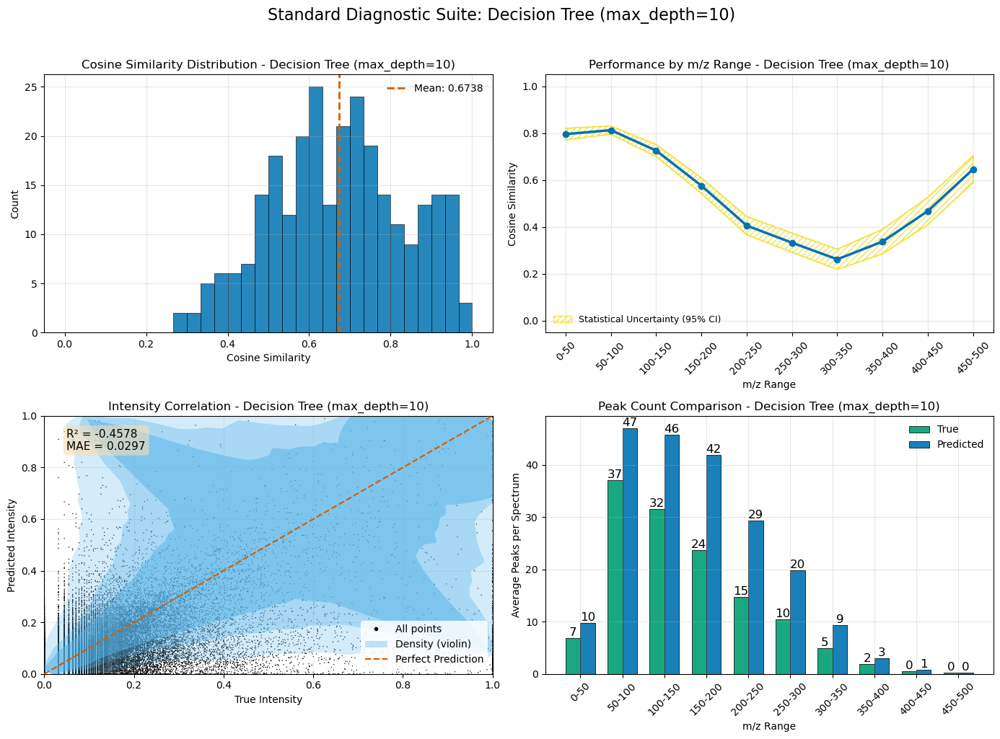


Generating random spectrum examples for Decision Tree (max_depth=10)...

Selected random examples:
  1. Index 196: Cosine=0.6236, WDP=0.2872
  2. Index 66: Cosine=0.6985, WDP=0.3179
  3. Index 201: Cosine=0.7123, WDP=0.4507
  4. Index 237: Cosine=0.4349, WDP=0.1193


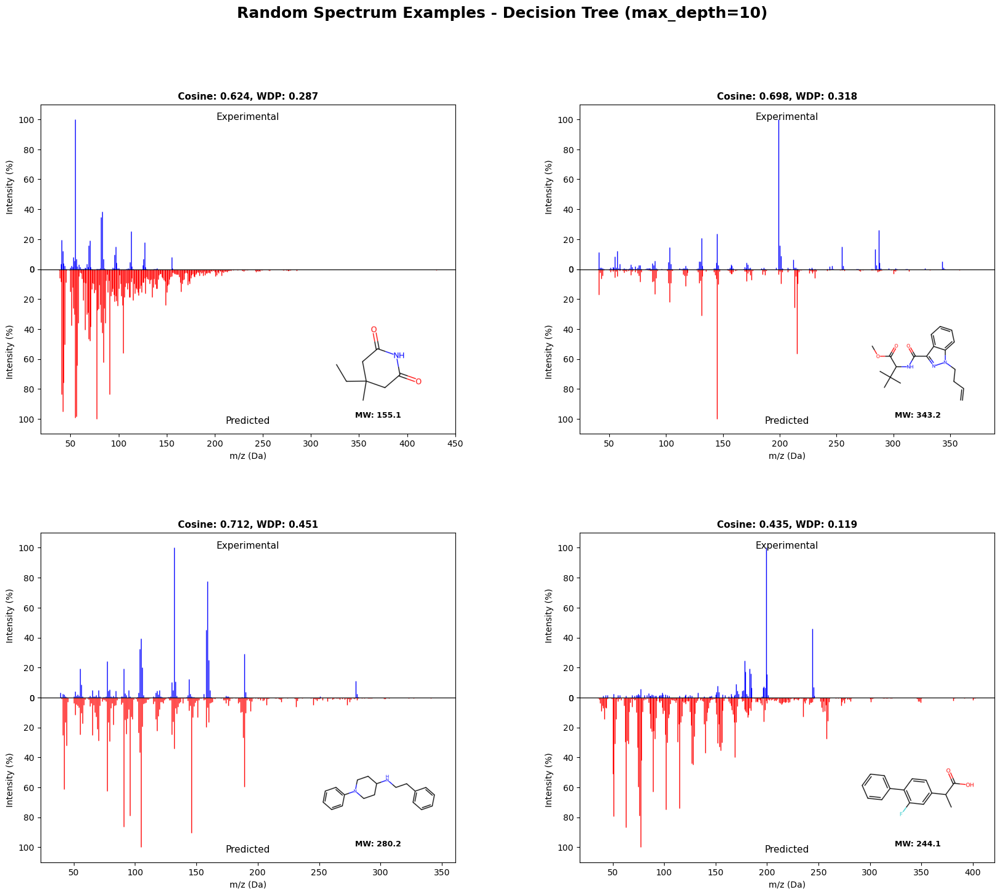


Training Decision Tree (max_depth=20)...

Decision Tree (max_depth=20) Performance:
  Cosine Similarity: 0.670322
  MSE: 0.0071
  R² Score: -0.7021
  MAE: 0.0294
  Peak F1: 0.7454
  Training Time: 4.58s

Generating standard diagnostic plots for Decision Tree (max_depth=20)...


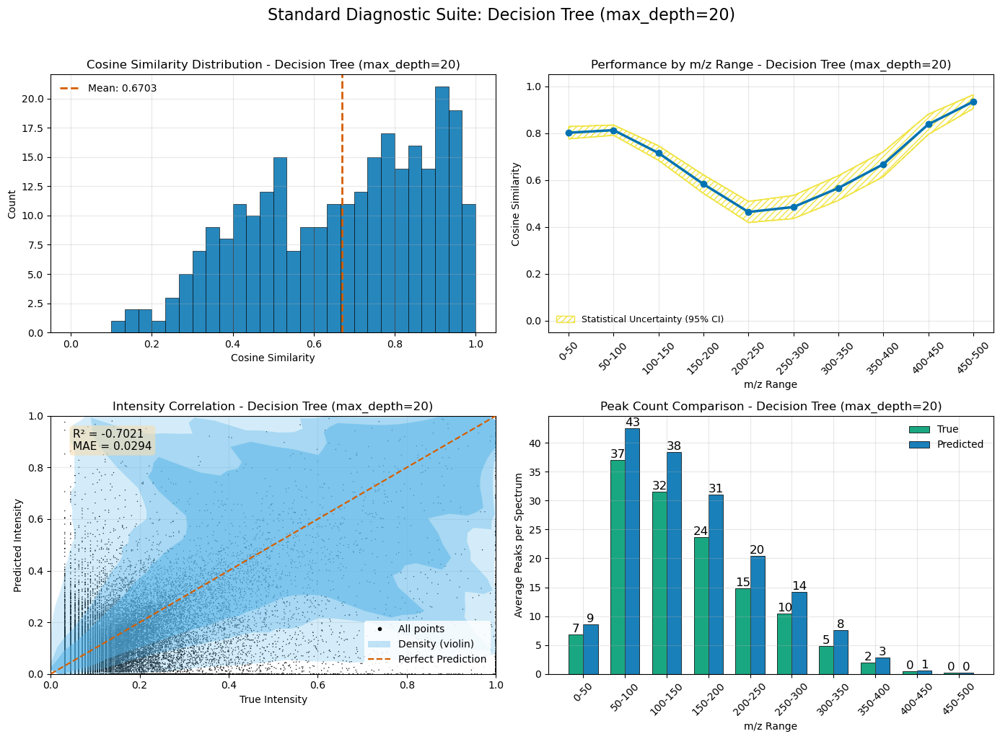


Generating random spectrum examples for Decision Tree (max_depth=20)...

Selected random examples:
  1. Index 97: Cosine=0.8512, WDP=0.6271
  2. Index 201: Cosine=0.5861, WDP=0.4238
  3. Index 76: Cosine=0.1703, WDP=0.0311
  4. Index 185: Cosine=0.6446, WDP=0.3951


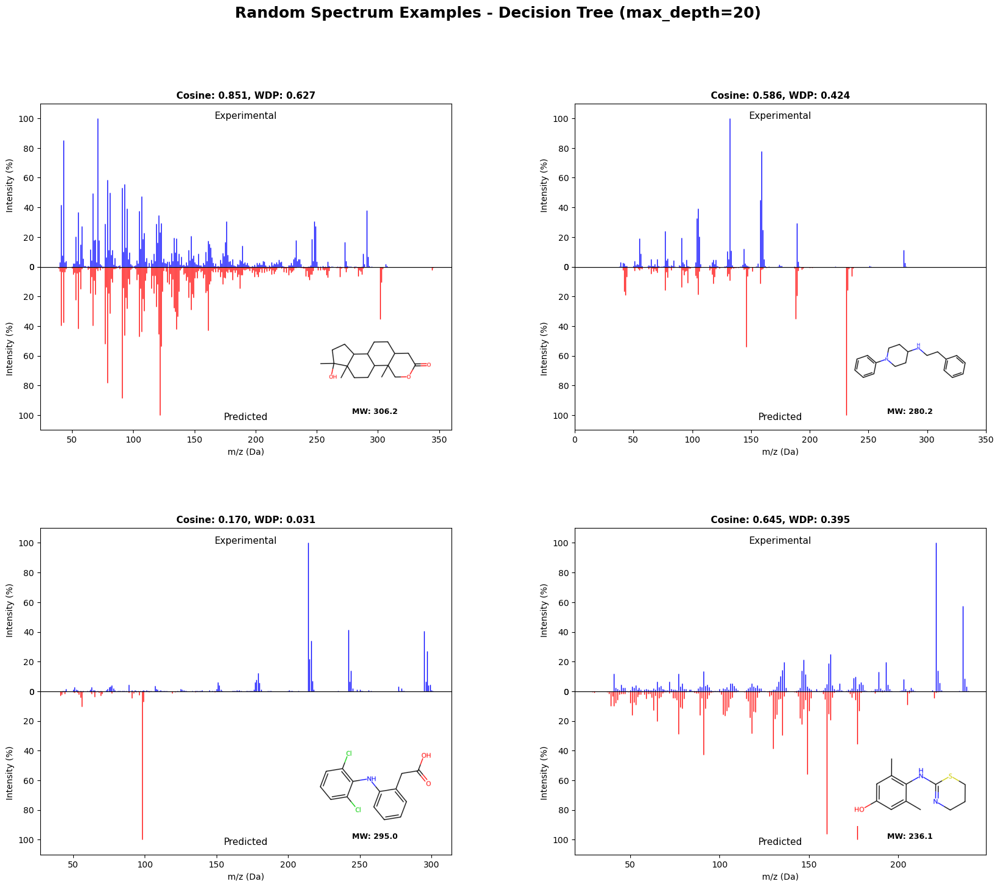


Training Random Forest (n=50)...

Random Forest (n=50) Performance:
  Cosine Similarity: 0.758094
  MSE: 0.0047
  R² Score: 0.1549
  MAE: 0.0261
  Peak F1: 0.6563
  Training Time: 15.93s

Generating standard diagnostic plots for Random Forest (n=50)...


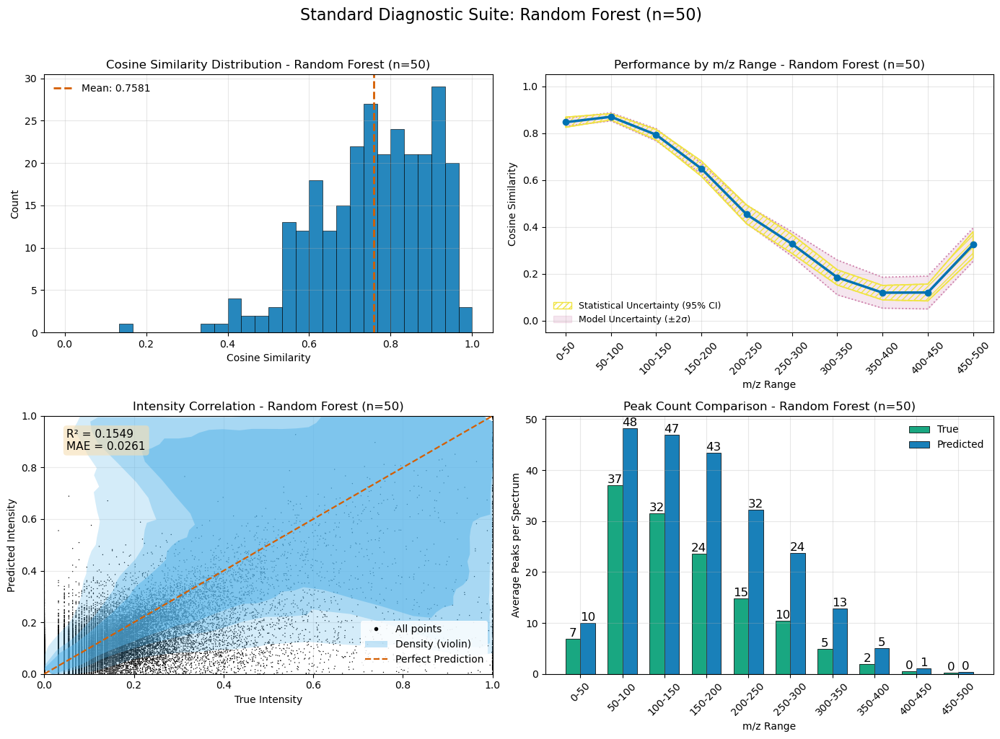


Generating random spectrum examples for Random Forest (n=50)...

Selected random examples:
  1. Index 102: Cosine=0.6053, WDP=0.2098
  2. Index 86: Cosine=0.7610, WDP=0.3740
  3. Index 49: Cosine=0.5662, WDP=0.1638
  4. Index 266: Cosine=0.7474, WDP=0.4017


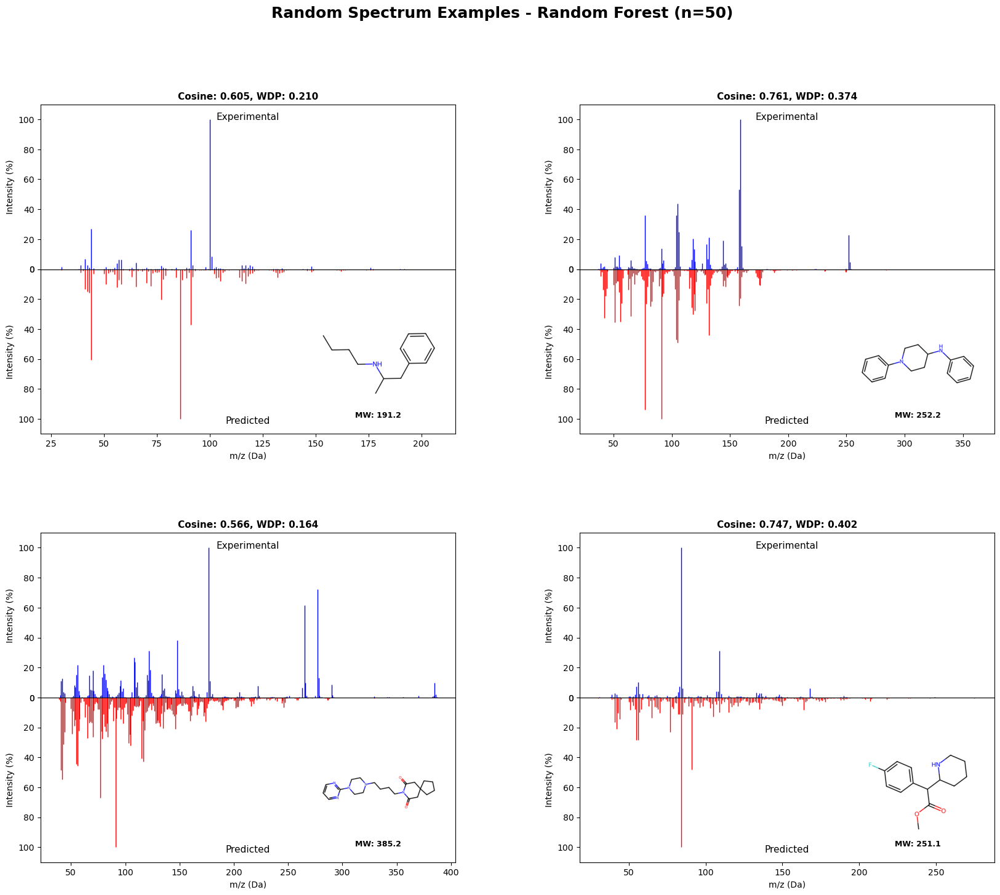


Training Extra Trees (n=50)...

Extra Trees (n=50) Performance:
  Cosine Similarity: 0.725591
  MSE: 0.0055
  R² Score: -1.3077
  MAE: 0.0273
  Peak F1: 0.7103
  Training Time: 19.48s

Generating standard diagnostic plots for Extra Trees (n=50)...


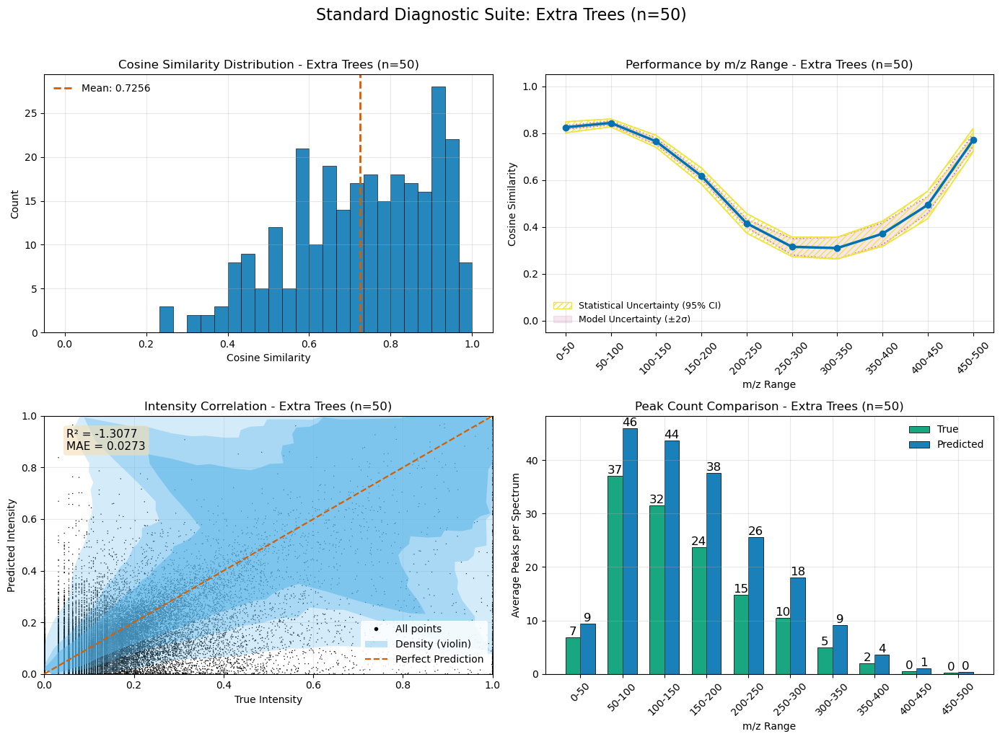


Generating random spectrum examples for Extra Trees (n=50)...

Selected random examples:
  1. Index 268: Cosine=0.7957, WDP=0.5146
  2. Index 86: Cosine=0.8229, WDP=0.6516
  3. Index 50: Cosine=0.2441, WDP=0.0992
  4. Index 141: Cosine=0.8844, WDP=0.4142


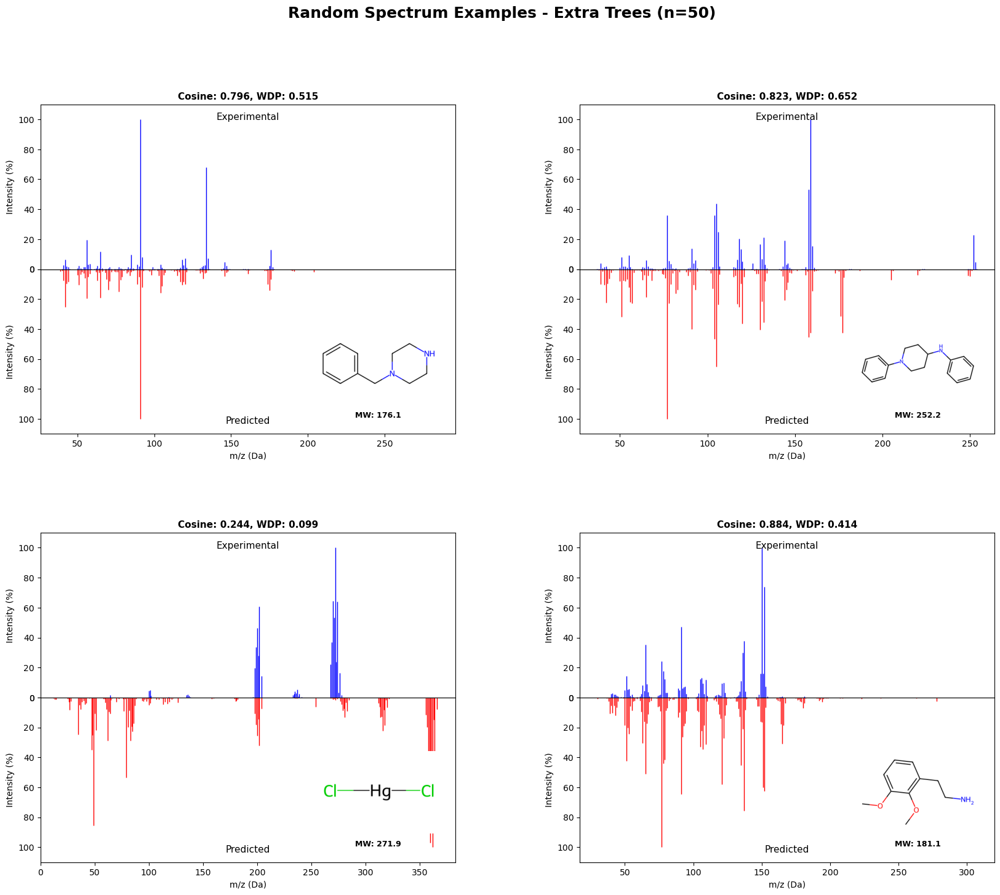


Tree-based methods complete


In [14]:
print("TRAINING TREE-BASED METHODS")
print("=" * 60)

# Define tree-based models with native multi-output
tree_models = [
    ("Decision Tree (max_depth=10)", 
     DecisionTreeRegressor(
         max_depth=10,
         min_samples_split=BASELINE_CONFIG['tree']['decision_tree_min_samples_split'],
         random_state=BASELINE_CONFIG['data']['random_state'])),
    
    ("Decision Tree (max_depth=20)", 
     DecisionTreeRegressor(
         max_depth=BASELINE_CONFIG['tree']['decision_tree_max_depth'],
         min_samples_split=BASELINE_CONFIG['tree']['decision_tree_min_samples_split'],
         random_state=BASELINE_CONFIG['data']['random_state'])),
    
    ("Random Forest (n=50)", 
     RandomForestRegressor(
         n_estimators=BASELINE_CONFIG['tree']['rf_n_estimators'],
         max_depth=BASELINE_CONFIG['tree']['rf_max_depth'],
         min_samples_split=5,
         n_jobs=BASELINE_CONFIG['tree']['rf_n_jobs'],
         random_state=BASELINE_CONFIG['data']['random_state'])),
    
    ("Extra Trees (n=50)", 
     ExtraTreesRegressor(
         n_estimators=BASELINE_CONFIG['tree']['extra_trees_n_estimators'],
         max_depth=BASELINE_CONFIG['tree']['extra_trees_max_depth'],
         min_samples_split=5,
         n_jobs=BASELINE_CONFIG['tree']['extra_trees_n_jobs'],
         random_state=BASELINE_CONFIG['data']['random_state']))
]

tree_results = []

# Train and evaluate each model
for model_name, model in tree_models:
    print(f"\nTraining {model_name}...")
    
    try:
        # Time the training
        start_time = time.time()
        model.fit(X_train_scaled, y_train_transformed)
        training_time = time.time() - start_time
        
        # Get predictions with uncertainty for ensemble models
        if hasattr(model, 'estimators_'):
            y_pred, tree_predictions = get_model_predictions_with_uncertainty(model, X_test_scaled)
        else:
            y_pred = model.predict(X_test_scaled)
            tree_predictions = None
        
        y_pred = np.maximum(y_pred, 0)  # Ensure non-negative
        
        # Evaluate
        results = evaluate_baseline_model(
            y_test_transformed, y_pred, model_name, training_time, BASELINE_CONFIG, tree_predictions
        )
        
        # Store results
        tree_results.append(results)
        MODEL_REGISTRY['tree'].append(results)
        
        # Generate standard plots (with uncertainties for ensemble models)
        print(f"\nGenerating standard diagnostic plots for {model_name}...")
        visualize_results(results, model_name=model_name, show_uncertainties=True)
        
        # Generate spectrum examples
        print(f"\nGenerating random spectrum examples for {model_name}...")
        create_spectrum_grid(results, test_smiles, n_examples=4, model_name=model_name)
        
        # Clear memory for large models
        if 'Forest' in model_name or 'Trees' in model_name:
            del model
            if tree_predictions is not None:
                del tree_predictions
            gc.collect()
        
    except Exception as e:
        print(f"  Error training {model_name}: {str(e)}")
        continue

print("\nTree-based methods complete")

## 9. Results Aggregation and Analysis

We aggregate per-model results into a summary table and visualize distributions and trade-offs (accuracy vs time). All metrics are computed on the test set with $\hat{\mathbf{y}}$ clipped to non-negative.

```mermaid
flowchart LR
  R1["Statistical"] --> Agg
  R2["Linear"] --> Agg
  R3["Neighbors"] --> Agg
  R4["Trees"] --> Agg
  Agg["Concatenate results"] --> Tab["Summary table"]
  Tab --> Viz["Comparison plots"]
```

In [15]:
print("AGGREGATING ALL RESULTS")
print("=" * 60)

# Collect all results
all_results = []
for category, results_list in MODEL_REGISTRY.items():
    for result in results_list:
        result['category'] = category
        all_results.append(result)

# Create summary DataFrame
summary_data = []
for result in all_results:
    summary_data.append({
        'Model': result['model_name'],
        'Category': result['category'],
        'Cosine Similarity': result['cosine_similarity'],
        'MSE': result['mse'],
        'R²': result['r2'],
        'MAE': result['mae'],
        'Peak F1': result['peak_metrics']['f1_score'],
        'Training Time (s)': result['training_time'],
        'Model Size (MB)': result.get('model_size_mb', None)
    })

summary_df = pd.DataFrame(summary_data)
summary_df = summary_df.sort_values('Cosine Similarity', ascending=False)

print("\n" + "=" * 100)
print("NATIVE MULTI-OUTPUT BASELINE COMPARISON - SUMMARY")
print("=" * 100)
print(f"\nTotal models evaluated: {len(summary_df)}")
print(f"Categories: {', '.join(MODEL_REGISTRY.keys())}")

# Display all models
print("\nAll Models Ranked by Cosine Similarity:")
print("-" * 100)
display_cols = ['Model', 'Category', 'Cosine Similarity', 'MSE', 'R²', 'Peak F1', 'Training Time (s)']
print(summary_df[display_cols].to_string(index=False))

# Category summary
print("\n\nPerformance by Category:")
print("-" * 60)
category_summary = summary_df.groupby('Category').agg({
    'Cosine Similarity': ['mean', 'max', 'std'],
    'Training Time (s)': 'mean'
}).round(4)
print(category_summary)

# Save full results
results_path = os.path.join(BASELINE_CONFIG['paths']['models_dir'], 'native_baseline_results.pkl')
with open(results_path, 'wb') as f:
    pickle.dump({
        'all_results': all_results,
        'summary_df': summary_df
    }, f)
print(f"\nResults saved to: {results_path}")

# Export summary to CSV
csv_path = os.path.join(BASELINE_CONFIG['paths']['models_dir'], 'native_baseline_summary.csv')
summary_df.to_csv(csv_path, index=False)
print(f"Summary exported to: {csv_path}")

AGGREGATING ALL RESULTS

NATIVE MULTI-OUTPUT BASELINE COMPARISON - SUMMARY

Total models evaluated: 18
Categories: statistical, linear, neighbors, tree

All Models Ranked by Cosine Similarity:
----------------------------------------------------------------------------------------------------
                         Model    Category  Cosine Similarity      MSE           R²  Peak F1  Training Time (s)
          Random Forest (n=50)        tree           0.758094 0.004705     0.154860 0.656327          15.933658
            Extra Trees (n=50)        tree           0.725591 0.005499    -1.307725 0.710323          19.477094
          KNN Regression (k=5)   neighbors           0.713935 0.005377     0.062792 0.755656           0.002586
         KNN Regression (k=10)   neighbors           0.712763 0.005357     0.098341 0.734885           0.002840
KNN Regression (k=10, uniform)   neighbors           0.702552 0.005528     0.058873 0.732459           0.003110
         KNN Regression (k=20)   n

## 10. Final Comparison Visualizations

We present:
- Category-wise distributions (cosine, training time)
- Accuracy vs time with Pareto frontier and top annotated points
- Ranked bar chart with log-time overlay

These mirror the neural notebook’s final comparison for consistency.

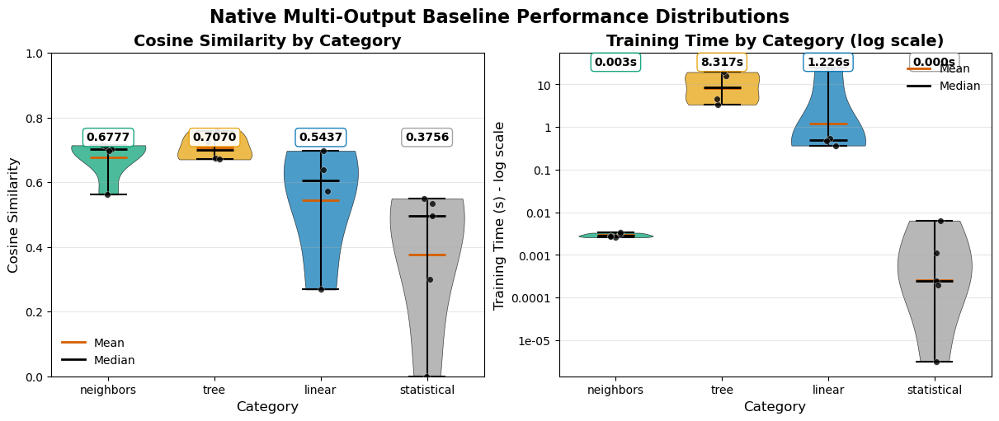

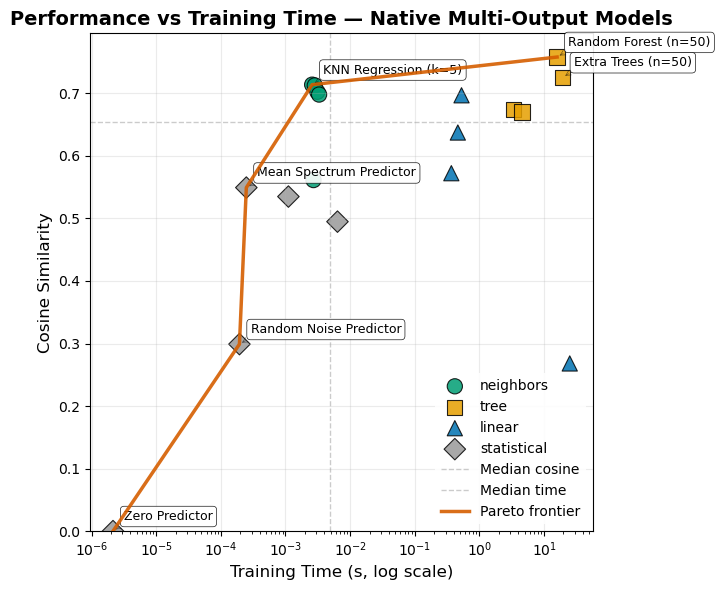

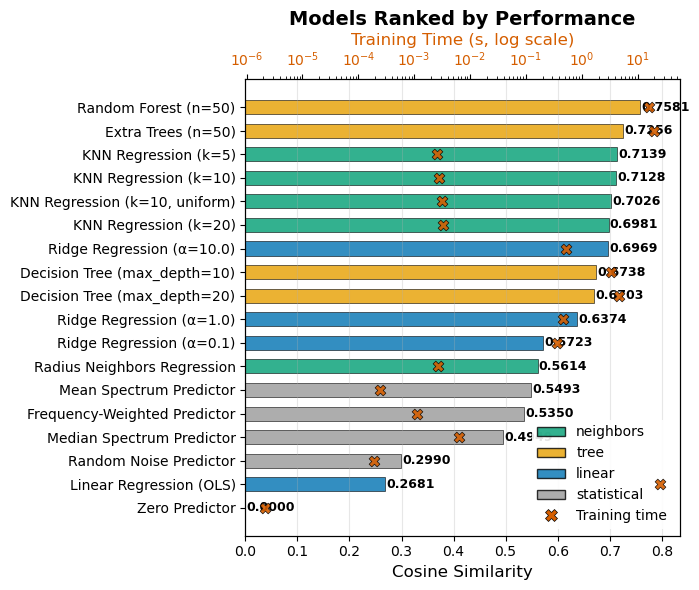


Visualizations complete


In [16]:
# === Multi-model comparison visualizations (improved) ===
# Uses: summary_df with columns ['Model','Category','Cosine Similarity','Training Time (s)']
# and MODEL_REGISTRY keys as categories.

# Prepare data (clean, order categories)
df = summary_df.copy()
df = df.replace([np.inf, -np.inf], np.nan).dropna(subset=['Cosine Similarity', 'Training Time (s)'])
cat_order = (
    df.groupby('Category')['Cosine Similarity']
      .median()
      .sort_values(ascending=False)
      .index.tolist()
)
df['Category'] = pd.Categorical(df['Category'], categories=cat_order, ordered=True)

# Map categories to PALETTE colors
cat_colors = {
    'statistical': PALETTE["grey"],
    'linear': PALETTE["blue"],
    'neighbors': PALETTE["green"],
    'tree': PALETTE["orange"]
}

# Marker styles for categories
marker_cycle = ['o', 's', '^', 'D']
markers = {c: marker_cycle[i % len(marker_cycle)] for i, c in enumerate(cat_order)}

# ------------------------------------------------------------------------------
# 1) Distributions panel: cosine + time with violin + overlays (styled like reference)
# ------------------------------------------------------------------------------
fig, axes = plt.subplots(1, 2, figsize=(12, 5), constrained_layout=True)

# Cosine similarity by category (violin with overlay)
ax = axes[0]
data_for_plot = []
positions = []
colors_list = []

for i, cat in enumerate(cat_order):
    cat_data = df[df['Category'] == cat]['Cosine Similarity'].values
    if len(cat_data) > 0:
        data_for_plot.append(cat_data)
        positions.append(i)
        colors_list.append(cat_colors.get(cat, PALETTE["black"]))

# Create violin plot with custom styling
parts = ax.violinplot(data_for_plot, positions=positions, 
                      showmeans=True, showmedians=True, widths=0.7)

# Color the violin plots
for pc, color in zip(parts['bodies'], colors_list):
    pc.set_facecolor(color)
    pc.set_alpha(0.7)
    pc.set_edgecolor(PALETTE["black"])
    pc.set_linewidth(0.5)

# Customize violin plot components
parts['cmeans'].set_color(PALETTE["vermillion"])
parts['cmeans'].set_linewidth(2)
parts['cmedians'].set_color(PALETTE["black"])
parts['cmedians'].set_linewidth(2)
parts['cbars'].set_color(PALETTE["black"])
parts['cmaxes'].set_color(PALETTE["black"])
parts['cmins'].set_color(PALETTE["black"])

# Add individual points as strip plot overlay
for i, cat in enumerate(cat_order):
    cat_data = df[df['Category'] == cat]['Cosine Similarity'].values
    if len(cat_data) > 0:
        # Add jitter for visibility
        x_jitter = np.random.normal(i, 0.04, size=len(cat_data))
        ax.scatter(x_jitter, cat_data, alpha=0.8, s=30, 
                  color=PALETTE["black"], edgecolor='white', linewidth=0.3, zorder=3)

# Add mean values as text annotations
for i, cat in enumerate(cat_order):
    cat_data = df[df['Category'] == cat]['Cosine Similarity'].values
    if len(cat_data) > 0:
        mean_val = np.mean(cat_data)
        ax.text(i, ax.get_ylim()[1] * 0.95, f'{mean_val:.4f}', 
               ha='center', va='top', fontweight='bold', fontsize=10,
               bbox=dict(boxstyle='round,pad=0.3', facecolor='white', 
                        edgecolor=cat_colors.get(cat, PALETTE["black"]), alpha=0.9))

ax.set_xticks(positions)
ax.set_xticklabels(cat_order)
ax.set_title('Cosine Similarity by Category', fontsize=14, fontweight='bold')
ax.set_xlabel('Category', fontsize=12)
ax.set_ylabel('Cosine Similarity', fontsize=12)
ax.set_ylim(0, 1)
ax.grid(True, alpha=0.3, axis='y')

# Add legend for mean/median lines
legend_elements = [
    Line2D([0], [0], color=PALETTE["vermillion"], linewidth=2, label='Mean'),
    Line2D([0], [0], color=PALETTE["black"], linewidth=2, label='Median')
]
ax.legend(handles=legend_elements, loc='lower left', frameon=False)

# Training time by category (log scale violin)
ax = axes[1]
data_for_plot = []
positions = []

for i, cat in enumerate(cat_order):
    cat_data = df[df['Category'] == cat]['Training Time (s)'].values
    if len(cat_data) > 0:
        # Log transform for better visualization
        data_for_plot.append(np.log10(cat_data + 1e-6))
        positions.append(i)

# Create violin plot
parts = ax.violinplot(data_for_plot, positions=positions,
                      showmeans=True, showmedians=True, widths=0.7)

# Color the violin plots
for pc, cat in zip(parts['bodies'], cat_order):
    pc.set_facecolor(cat_colors.get(cat, PALETTE["black"]))
    pc.set_alpha(0.7)
    pc.set_edgecolor(PALETTE["black"])
    pc.set_linewidth(0.5)

# Customize components
parts['cmeans'].set_color(PALETTE["vermillion"])
parts['cmeans'].set_linewidth(2)
parts['cmedians'].set_color(PALETTE["black"])
parts['cmedians'].set_linewidth(2)
parts['cbars'].set_color(PALETTE["black"])
parts['cmaxes'].set_color(PALETTE["black"])
parts['cmins'].set_color(PALETTE["black"])

# Add strip plot overlay
for i, cat in enumerate(cat_order):
    cat_data = df[df['Category'] == cat]['Training Time (s)'].values
    if len(cat_data) > 0:
        log_data = np.log10(cat_data + 1e-6)
        x_jitter = np.random.normal(i, 0.04, size=len(cat_data))
        ax.scatter(x_jitter, log_data, alpha=0.8, s=30,
                  color=PALETTE["black"], edgecolor='white', linewidth=0.3, zorder=3)

# Add geometric mean as text
for i, cat in enumerate(cat_order):
    cat_data = df[df['Category'] == cat]['Training Time (s)'].values
    if len(cat_data) > 0:
        geom_mean = np.exp(np.mean(np.log(cat_data + 1e-6)))
        ax.text(i, ax.get_ylim()[1] * 0.95, f'{geom_mean:.3f}s',
               ha='center', va='top', fontweight='bold', fontsize=10,
               bbox=dict(boxstyle='round,pad=0.3', facecolor='white',
                        edgecolor=cat_colors.get(cat, PALETTE["black"]), alpha=0.9))

ax.set_xticks(positions)
ax.set_xticklabels(cat_order)
ax.set_title('Training Time by Category (log scale)', fontsize=14, fontweight='bold')
ax.set_xlabel('Category', fontsize=12)
ax.set_ylabel('Training Time (s) - log scale', fontsize=12)

# Fix y-axis labels to show actual time values
y_ticks = ax.get_yticks()
ax.set_yticklabels([f'{10**y:.2g}' for y in y_ticks])

ax.grid(True, alpha=0.3, axis='y')
ax.legend(handles=legend_elements, loc='upper right', frameon=False)

plt.suptitle('Native Multi-Output Baseline Performance Distributions', fontsize=16, fontweight='bold')
plt.show()

# ------------------------------------------------------------------------------
# 2) Accuracy vs Time scatter with Pareto frontier
# ------------------------------------------------------------------------------
fig, ax = plt.subplots(figsize=(7, 6))

# Plot each category with its color and marker
for cat in cat_order:
    g = df[df['Category'] == cat]
    if len(g) > 0:
        ax.scatter(
            g['Training Time (s)'], g['Cosine Similarity'],
            label=cat, s=120, alpha=0.85, marker=markers[cat],
            edgecolor=PALETTE["black"], linewidths=0.8, 
            c=[cat_colors.get(cat, PALETTE["black"])]*len(g)
        )

# Add reference lines at median values
ax.axhline(df['Cosine Similarity'].median(), ls='--', lw=1, 
          color=PALETTE["grey"], alpha=0.5, label='Median cosine')
ax.axvline(df['Training Time (s)'].median(), ls='--', lw=1, 
          color=PALETTE["grey"], alpha=0.5, label='Median time')

ax.set_xscale('log')
ax.set_xlabel('Training Time (s, log scale)', fontsize=12)
ax.set_ylabel('Cosine Similarity', fontsize=12)
ax.set_title('Performance vs Training Time — Native Multi-Output Models', fontsize=14, fontweight='bold')
ax.grid(True, alpha=0.25)

# Calculate and plot Pareto frontier
pts = df[['Training Time (s)', 'Cosine Similarity']].to_numpy()
order = np.argsort(pts[:, 0])  # Sort by time
pts_sorted = pts[order]
pareto_idx = []
best_acc = -np.inf

for i, (t, acc) in enumerate(pts_sorted):
    if acc > best_acc:
        pareto_idx.append(order[i])
        best_acc = acc

if pareto_idx:
    front = df.iloc[pareto_idx].sort_values('Training Time (s)')
    ax.plot(
        front['Training Time (s)'], front['Cosine Similarity'],
        lw=2.5, ls='-', color=PALETTE["vermillion"], alpha=0.9, 
        label='Pareto frontier', zorder=5
    )

# Annotate top performers
top_acc = df.nlargest(3, 'Cosine Similarity')
top_fast = df.nsmallest(3, 'Training Time (s)')
to_annotate = pd.concat([top_acc, top_fast]).drop_duplicates(subset=['Model'])

for _, r in to_annotate.iterrows():
    ax.annotate(
        r['Model'], (r['Training Time (s)'], r['Cosine Similarity']),
        xytext=(8, 8), textcoords='offset points', fontsize=9,
        bbox=dict(boxstyle='round,pad=0.3', facecolor='white', 
                 alpha=0.9, edgecolor=PALETTE["black"], linewidth=0.5),
        arrowprops=dict(arrowstyle='->', connectionstyle='arc3,rad=0.2',
                       color=PALETTE["black"], alpha=0.5, linewidth=0.5)
    )

ax.legend(loc='lower right', frameon=True, facecolor='white', 
         framealpha=0.9, edgecolor='none')
ax.set_ylim(0, df['Cosine Similarity'].max() * 1.05)

plt.tight_layout()
plt.show()

# ------------------------------------------------------------------------------
# 3) Ranked horizontal bar chart with dual metrics
# ------------------------------------------------------------------------------
df_rank = df.sort_values('Cosine Similarity', ascending=True)
fig, ax1 = plt.subplots(figsize=(7, 6))

y_pos = np.arange(len(df_rank))

# Create horizontal bars for cosine similarity
bars = ax1.barh(y_pos, df_rank['Cosine Similarity'], height=0.6, 
               edgecolor=PALETTE["black"], linewidth=0.5)

# Color bars by category
for bar, cat in zip(bars, df_rank['Category']):
    bar.set_facecolor(cat_colors.get(cat, PALETTE["black"]))
    bar.set_alpha(0.8)

# Add value labels on bars
for i, (idx, row) in enumerate(df_rank.iterrows()):
    ax1.text(row['Cosine Similarity'] + 0.002, i, f"{row['Cosine Similarity']:.4f}",
            va='center', fontsize=9, fontweight='bold')

ax1.set_yticks(y_pos)
ax1.set_yticklabels(df_rank['Model'], fontsize=10)
ax1.set_xlabel('Cosine Similarity', fontsize=12)
ax1.set_title('Models Ranked by Performance', fontsize=14, fontweight='bold')
ax1.grid(axis='x', alpha=0.3)
ax1.set_xlim(0, df_rank['Cosine Similarity'].max() * 1.1)

# Add training time overlay on secondary axis
ax2 = ax1.twiny()
ax2.scatter(df_rank['Training Time (s)'], y_pos, s=60, marker='X',
           color=PALETTE["vermillion"], edgecolor=PALETTE["black"], 
           linewidth=0.5, alpha=0.9, label='Training time', zorder=5)
ax2.set_xscale('log')
ax2.set_xlabel('Training Time (s, log scale)', fontsize=12, color=PALETTE["vermillion"])
ax2.tick_params(axis='x', labelcolor=PALETTE["vermillion"])

# Create combined legend
from matplotlib.patches import Patch
cat_handles = [Patch(facecolor=cat_colors.get(c, PALETTE["black"]), 
                    edgecolor=PALETTE["black"], label=c, alpha=0.8) 
              for c in cat_order]
time_handle = Line2D([0], [0], marker='X', color=PALETTE["vermillion"], 
                    linestyle='None', markersize=8, label='Training time',
                    markeredgecolor=PALETTE["black"], markeredgewidth=0.5)
ax1.legend(handles=cat_handles + [time_handle], loc='lower right', 
          frameon=True, facecolor='white', framealpha=0.9, edgecolor='none')

plt.tight_layout()
plt.show()

print("\nVisualizations complete")